<a href="https://colab.research.google.com/github/GitZy6666/ZyRep/blob/main/Predict-Saham.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Library & Package**

In [ ]:
!pip install --upgrade quandl

In [ ]:
!pip install -U scikit-learn

     |████████████████████████████████| 22.3 MB 1.6 MB/s 
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.22.2.post1
    Uninstalling scikit-learn-0.22.2.post1:
      Successfully uninstalled scikit-learn-0.22.2.post1


In [ ]:
import sklearn

sklearn.__version__

'0.24.2'

In [ ]:
# Libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import quandl 

**Pengolahan Data**

In [ ]:
data = pd.read_csv('Sahambaru.csv')

In [ ]:
data.head()

,Date,ACES,ADRO,AKRA,ASII,BBCA,BBNI,BBRI,BBTN,BMRI,BSDE,CPIN,CTRA,ERAA,EXCL,GGRM,HMSP,ICBP,INCO,INDF,INKP,INTP,ITMG,JPFA,JSMR,KLBF,MEDC,MNCN,PGAS,PTBA,PTPP,PWON,SMGR,SMRA,TBIG,TKIM,TLKM,TOWR,TPIA,UNTR,UNVR,WIKA
0,30/12/2013,640,1010,4475,6750,9500,3850,1450,890,3900.0,1290,3400,776.710388,208.0,5129.231934,42500,2351.431641,5100.0,2375,6700,1410,20000,27150,1270,4614.193359,1320,371.428619,2600,4550,2000,1112.056274,280,14350,820,1200,1376.190918,2125,540.0,569.353088,19550,5300,1537.281860
1,06/01/2014,680,940,4520,6750,9400,3930,1520,865,4125.0,1370,3550,796.373962,219.0,4956.613770,42500,2298.675049,5000.0,2300,6675,1255,20875,25700,1280,4783.796387,1370,424.761932,2510,4435,1835,1164.332397,273,14900,900,1160,1337.963501,2145,570.0,545.793640,19000,5180,1648.410645
2,13/01/2014,735,975,4685,6925,9900,4275,1665,935,4375.0,1455,3915,801.289856,221.0,5055.252441,45000,2411.724854,5462.5,2620,6675,1265,21900,25125,1390,4988.317383,1390,416.190521,2450,4385,1895,1273.637085,318,15200,900,1200,1353.254517,2225,600.0,549.720215,19300,5530,1810.473511
3,20/01/2014,735,1040,4470,6525,10175,4300,1680,925,4337.5,1440,3885,850.448730,239.0,4956.613770,42150,2553.036865,5600.0,2650,7275,1310,21300,26875,1440,5312.558105,1410,470.476227,2385,4700,1920,1230.865723,307,14550,940,1280,1337.963501,2210,600.0,549.720215,19700,5615,1778.060913
4,27/01/2014,760,950,4400,6425,9925,4360,1665,900,4350.0,1440,4135,840.616943,240.0,4783.995117,41900,2553.036865,5500.0,2305,6975,1285,22400,26800,1390,5162.908691,1405,452.381012,2235,4770,1850,1283.141846,307,14200,955,1240,1376.190918,2275,640.0,569.353088,19300,5710,1805.843140


In [ ]:
data.tail()

,Date,ACES,ADRO,AKRA,ASII,BBCA,BBNI,BBRI,BBTN,BMRI,BSDE,CPIN,CTRA,ERAA,EXCL,GGRM,HMSP,ICBP,INCO,INDF,INKP,INTP,ITMG,JPFA,JSMR,KLBF,MEDC,MNCN,PGAS,PTBA,PTPP,PWON,SMGR,SMRA,TBIG,TKIM,TLKM,TOWR,TPIA,UNTR,UNVR,WIKA
361,30/11/2020,1625,1435,3110,5700,31950,6350,4300,1720,6600.0,1060,6375,910.0,354.0,2450.0,44000,1645.0,9950.0,4970,7025,9525,14300,14950,1430,4360.0,1475,560.0,1070,1450,2480,1600.0,525,11675,800,1580,8600.0,3250,1055.0,9750.0,26500,7600,1825.0
362,07/12/2020,1705,1535,3320,5675,33675,6575,4280,1705,6775.0,1115,6275,915.0,389.0,2460.0,41350,1555.0,9825.0,5225,6925,10700,14425,14675,1420,4480.0,1465,630.0,1045,1655,2810,1565.0,550,11475,810,1540,10025.0,3280,1015.0,9975.0,26150,7475,1785.0
363,14/12/2020,1850,1480,3370,6200,34000,6650,4280,1940,6700.0,1300,6600,1070.0,412.0,2790.0,42025,1570.0,9700.0,5375,6825,10400,14825,14875,1635,4710.0,1540,665.0,1270,1790,2980,1770.0,575,12550,895,1485,10300.0,3510,985.0,9075.0,26625,7600,1980.0
364,21/12/2020,1780,1490,3240,6000,33625,6250,4160,1800,6350.0,1275,6600,1040.0,430.0,2710.0,41075,1505.0,9525.0,5075,6800,10600,14025,14250,1540,4710.0,1465,605.0,1160,1650,2820,1780.0,530,12350,840,1730,10000.0,3320,965.0,9150.0,26075,7425,1980.0
365,28/12/2020,1785,1505,3310,6075,33900,6450,4250,1820,6525.0,1275,6775,1035.0,472.0,2810.0,41025,1505.0,9475.0,5350,6925,11025,14500,14350,1580,4720.0,1500,615.0,1195,1770,2850,1780.0,535,12550,845,1700,10600.0,3430,965.0,9375.0,26925,7450,2010.0


In [ ]:
from datetime import datetime as dt

# A variable for predicting 'n' days out into the future
data_prediksi = data.iloc[:314]
forecast_out = 4 #'n=30' days

# newdate = {'Date': ['4/01/2021', '11/01/2021', '18/01/2021', '25/01/2021']}
newdate = data_prediksi.iloc[-forecast_out:,0:1]
nwdate = pd.DataFrame(newdate)

weeklydate = pd.to_datetime(nwdate.Date)
weeklydate = weeklydate.dt.strftime("%d-%m-%Y")
weeklydate = pd.to_datetime(weeklydate)
weeklydate = np.array(weeklydate)
weeklydate

array(['2019-12-09T00:00:00.000000000', '2019-12-16T00:00:00.000000000',
       '2019-12-23T00:00:00.000000000', '2019-12-30T00:00:00.000000000'],
      dtype='datetime64[ns]')

In [ ]:
return_weeklydate = pd.to_datetime(data.Date)
return_weeklydate = return_weeklydate.dt.strftime("%d-%m-%Y")
return_weeklydate = pd.to_datetime(return_weeklydate)
return_weeklydate

0     2013-12-30
1     2014-01-06
2     2014-01-13
3     2014-01-20
4     2014-01-27
         ...    
361   2020-11-30
362   2020-12-07
363   2020-12-14
364   2020-12-21
365   2020-12-28
Name: Date, Length: 366, dtype: datetime64[ns]

**Return Saham**

In [ ]:
def return_saham(datax, date):

  return_saham = pd.DataFrame(date)
  cum_returns_saham = pd.DataFrame(date)

  for i in range(1, len(datax.columns)):
    
    saham = datax.columns[i]
    weekly_returns = datax[saham].pct_change()
    cum_returns = (weekly_returns + 1).cumprod()
    return_saham[saham] = weekly_returns
    cum_returns_saham[saham] = cum_returns
  
  return return_saham, cum_returns_saham

In [ ]:
return_saham, cum_return_shm = return_saham(data, return_weeklydate) 

In [ ]:
return_saham.head()

,Date,ACES,ADRO,AKRA,ASII,BBCA,BBNI,BBRI,BBTN,BMRI,BSDE,CPIN,CTRA,ERAA,EXCL,GGRM,HMSP,ICBP,INCO,INDF,INKP,INTP,ITMG,JPFA,JSMR,KLBF,MEDC,MNCN,PGAS,PTBA,PTPP,PWON,SMGR,SMRA,TBIG,TKIM,TLKM,TOWR,TPIA,UNTR,UNVR,WIKA
0,2013-12-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2014-01-06,0.062500,-0.069307,0.010056,0.000000,-0.010526,0.020779,0.048276,-0.028090,0.057692,0.062016,0.044118,0.025316,0.052885,-0.033654,0.000000,-0.022436,-0.019608,-0.031579,-0.003731,-0.109929,0.043750,-0.053407,0.007874,0.036757,0.037879,0.143590,-0.034615,-0.025275,-0.082500,0.047009,-0.025000,0.038328,0.097561,-0.033333,-0.027778,0.009412,0.055556,-0.041379,-0.028133,-0.022642,0.072289
2,2014-01-13,0.080882,0.037234,0.036504,0.025926,0.053191,0.087786,0.095395,0.080925,0.060606,0.062044,0.102817,0.006173,0.009132,0.019900,0.058824,0.049180,0.092500,0.139130,0.000000,0.007968,0.049102,-0.022374,0.085938,0.042753,0.014599,-0.020179,-0.023904,-0.011274,0.032698,0.093878,0.164835,0.020134,0.000000,0.034483,0.011429,0.037296,0.052632,0.007194,0.015789,0.067568,0.098315
3,2014-01-20,0.000000,0.066667,-0.045891,-0.057762,0.027778,0.005848,0.009009,-0.010695,-0.008571,-0.010309,-0.007663,0.061350,0.081448,-0.019512,-0.063333,0.058594,0.025172,0.011450,0.089888,0.035573,-0.027397,0.069652,0.035971,0.065000,0.014388,0.130435,-0.026531,0.071836,0.013193,-0.033582,-0.034591,-0.042763,0.044444,0.066667,-0.011299,-0.006742,0.000000,0.000000,0.020725,0.015371,-0.017903
4,2014-01-27,0.034014,-0.086538,-0.015660,-0.015326,-0.024570,0.013953,-0.008929,-0.027027,0.002882,0.000000,0.064350,-0.011561,0.004184,-0.034826,-0.005931,0.000000,-0.017857,-0.130189,-0.041237,-0.019084,0.051643,-0.002791,-0.034722,-0.028169,-0.003546,-0.038461,-0.062893,0.014894,-0.036458,0.042471,0.000000,-0.024055,0.015957,-0.031250,0.028571,0.029412,0.066667,0.035714,-0.020305,0.016919,0.015625


In [ ]:
return_saham.tail()

,Date,ACES,ADRO,AKRA,ASII,BBCA,BBNI,BBRI,BBTN,BMRI,BSDE,CPIN,CTRA,ERAA,EXCL,GGRM,HMSP,ICBP,INCO,INDF,INKP,INTP,ITMG,JPFA,JSMR,KLBF,MEDC,MNCN,PGAS,PTBA,PTPP,PWON,SMGR,SMRA,TBIG,TKIM,TLKM,TOWR,TPIA,UNTR,UNVR,WIKA
361,2020-11-30,-0.021084,0.032374,0.072414,0.027027,0.000783,0.000000,0.007026,-0.011494,-0.007519,-0.009346,-0.019231,-0.047120,-0.008403,-0.031621,-0.007332,0.028125,-0.061321,0.061966,-0.037671,0.021448,-0.028862,0.261603,0.032491,-0.009091,-0.003378,0.098039,0.009434,-0.026846,0.029046,0.142857,0.009615,-0.020964,-0.053254,0.046358,0.150502,-0.060694,-0.062222,0.054054,0.071790,-0.019355,0.076696
362,2020-12-07,0.049231,0.069686,0.067524,-0.004386,0.053991,0.035433,-0.004651,-0.008721,0.026515,0.051887,-0.015686,0.005495,0.098870,0.004082,-0.060227,-0.054711,-0.012563,0.051308,-0.014235,0.123360,0.008741,-0.018395,-0.006993,0.027523,-0.006780,0.125000,-0.023364,0.141379,0.133065,-0.021875,0.047619,-0.017131,0.012500,-0.025316,0.165698,0.009231,-0.037915,0.023077,-0.013208,-0.016447,-0.021918
363,2020-12-14,0.085044,-0.035831,0.015060,0.092511,0.009651,0.011407,0.000000,0.137830,-0.011070,0.165919,0.051793,0.169399,0.059126,0.134146,0.016324,0.009646,-0.012723,0.028708,-0.014440,-0.028037,0.027730,0.013629,0.151408,0.051339,0.051195,0.055556,0.215311,0.081571,0.060498,0.130990,0.045455,0.093682,0.104938,-0.035714,0.027431,0.070122,-0.029557,-0.090226,0.018164,0.016722,0.109244
364,2020-12-21,-0.037838,0.006757,-0.038576,-0.032258,-0.011029,-0.060150,-0.028037,-0.072165,-0.052239,-0.019231,0.000000,-0.028037,0.043689,-0.028674,-0.022606,-0.041401,-0.018041,-0.055814,-0.003663,0.019231,-0.053963,-0.042017,-0.058104,0.000000,-0.048701,-0.090226,-0.086614,-0.078212,-0.053691,0.005650,-0.078261,-0.015936,-0.061453,0.164983,-0.029126,-0.054131,-0.020305,0.008264,-0.020657,-0.023026,0.000000
365,2020-12-28,0.002809,0.010067,0.021605,0.012500,0.008178,0.032000,0.021635,0.011111,0.027559,0.000000,0.026515,-0.004808,0.097674,0.036900,-0.001217,0.000000,-0.005249,0.054187,0.018382,0.040094,0.033868,0.007018,0.025974,0.002123,0.023891,0.016529,0.030172,0.072727,0.010638,0.000000,0.009434,0.016194,0.005952,-0.017341,0.060000,0.033133,0.000000,0.024590,0.032598,0.003367,0.015152


In [ ]:
cum_return_shm.head()

,Date,ACES,ADRO,AKRA,ASII,BBCA,BBNI,BBRI,BBTN,BMRI,BSDE,CPIN,CTRA,ERAA,EXCL,GGRM,HMSP,ICBP,INCO,INDF,INKP,INTP,ITMG,JPFA,JSMR,KLBF,MEDC,MNCN,PGAS,PTBA,PTPP,PWON,SMGR,SMRA,TBIG,TKIM,TLKM,TOWR,TPIA,UNTR,UNVR,WIKA
0,2013-12-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2014-01-06,1.062500,0.930693,1.010056,1.000000,0.989474,1.020779,1.048276,0.971910,1.057692,1.062016,1.044118,1.025316,1.052885,0.966346,1.000000,0.977564,0.980392,0.968421,0.996269,0.890071,1.04375,0.946593,1.007874,1.036757,1.037879,1.143590,0.965385,0.974725,0.9175,1.047009,0.975000,1.038328,1.097561,0.966667,0.972222,1.009412,1.055556,0.958621,0.971867,0.977358,1.072289
2,2014-01-13,1.148438,0.965347,1.046927,1.025926,1.042105,1.110390,1.148276,1.050562,1.121795,1.127907,1.151471,1.031646,1.062500,0.985577,1.058824,1.025641,1.071078,1.103158,0.996269,0.897163,1.09500,0.925414,1.094488,1.081081,1.053030,1.120513,0.942308,0.963736,0.9475,1.145299,1.135714,1.059233,1.097561,1.000000,0.983333,1.047059,1.111111,0.965517,0.987212,1.043396,1.177711
3,2014-01-20,1.148438,1.029703,0.998883,0.966667,1.071053,1.116883,1.158621,1.039326,1.112179,1.116279,1.142647,1.094937,1.149038,0.966346,0.991765,1.085737,1.098039,1.115789,1.085821,0.929078,1.06500,0.989871,1.133858,1.151351,1.068182,1.266667,0.917308,1.032967,0.9600,1.106838,1.096429,1.013937,1.146341,1.066667,0.972222,1.040000,1.111111,0.965517,1.007673,1.059434,1.156626
4,2014-01-27,1.187500,0.940594,0.983240,0.951852,1.044737,1.132468,1.148276,1.011236,1.115385,1.116279,1.216176,1.082278,1.153846,0.932692,0.985882,1.085737,1.078431,0.970526,1.041045,0.911348,1.12000,0.987109,1.094488,1.118919,1.064394,1.217949,0.859615,1.048352,0.9250,1.153846,1.096429,0.989547,1.164634,1.033333,1.000000,1.070588,1.185185,1.000000,0.987212,1.077358,1.174699


In [ ]:
cum_return_shm.tail()

,Date,ACES,ADRO,AKRA,ASII,BBCA,BBNI,BBRI,BBTN,BMRI,BSDE,CPIN,CTRA,ERAA,EXCL,GGRM,HMSP,ICBP,INCO,INDF,INKP,INTP,ITMG,JPFA,JSMR,KLBF,MEDC,MNCN,PGAS,PTBA,PTPP,PWON,SMGR,SMRA,TBIG,TKIM,TLKM,TOWR,TPIA,UNTR,UNVR,WIKA
361,2020-11-30,2.539063,1.420792,0.694972,0.844444,3.363158,1.649351,2.965517,1.932584,1.692308,0.821705,1.875000,1.171608,1.701923,0.477654,1.035294,0.699574,1.950980,2.092632,1.048507,6.755319,0.71500,0.550645,1.125984,0.944911,1.117424,1.507692,0.411538,0.318681,1.240,1.438776,1.875000,0.813589,0.975610,1.316667,6.249133,1.529412,1.953704,17.124699,1.355499,1.433962,1.187160
362,2020-12-07,2.664063,1.519802,0.741899,0.840741,3.544737,1.707792,2.951724,1.915730,1.737179,0.864341,1.845588,1.178045,1.870192,0.479604,0.972941,0.661299,1.926471,2.200000,1.033582,7.588652,0.72125,0.540516,1.118110,0.970917,1.109848,1.696154,0.401923,0.363736,1.405,1.407303,1.964286,0.799652,0.987805,1.283333,7.284600,1.543529,1.879630,17.519884,1.337596,1.410377,1.161140
363,2020-12-14,2.890625,1.465347,0.753073,0.918519,3.578947,1.727273,2.951724,2.179775,1.717949,1.007752,1.941176,1.377605,1.980769,0.543941,0.988824,0.667678,1.901961,2.263158,1.018657,7.375887,0.74125,0.547882,1.287402,1.020763,1.166667,1.790384,0.488462,0.393407,1.490,1.591646,2.053571,0.874564,1.091463,1.237500,7.484427,1.651765,1.824074,15.939142,1.361893,1.433962,1.287988
364,2020-12-21,2.781250,1.475248,0.724022,0.888889,3.539474,1.623377,2.868966,2.022472,1.628205,0.988372,1.941176,1.338980,2.067308,0.528344,0.966471,0.640036,1.867647,2.136842,1.014925,7.517730,0.70125,0.524862,1.212598,1.020763,1.109848,1.628846,0.446154,0.362637,1.410,1.600638,1.892857,0.860627,1.024390,1.441667,7.266434,1.562353,1.787037,16.070871,1.333760,1.400943,1.287988
365,2020-12-28,2.789063,1.490099,0.739665,0.900000,3.568421,1.675325,2.931034,2.044944,1.673077,0.988372,1.992647,1.332543,2.269231,0.547840,0.965294,0.640036,1.857843,2.252632,1.033582,7.819149,0.72500,0.528545,1.244094,1.022931,1.136364,1.655769,0.459615,0.389011,1.425,1.600638,1.910714,0.874564,1.030488,1.416667,7.702420,1.614118,1.787037,16.466056,1.377238,1.405660,1.307503


**Visualisasi Data Hasil Return**

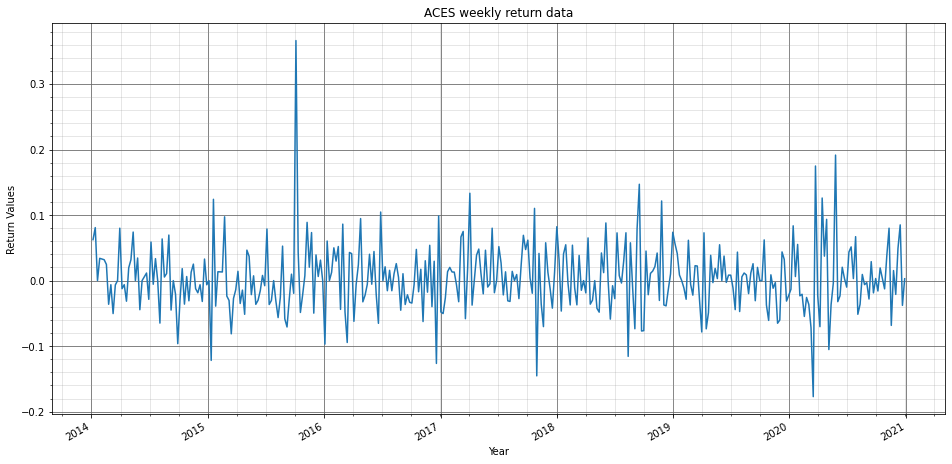

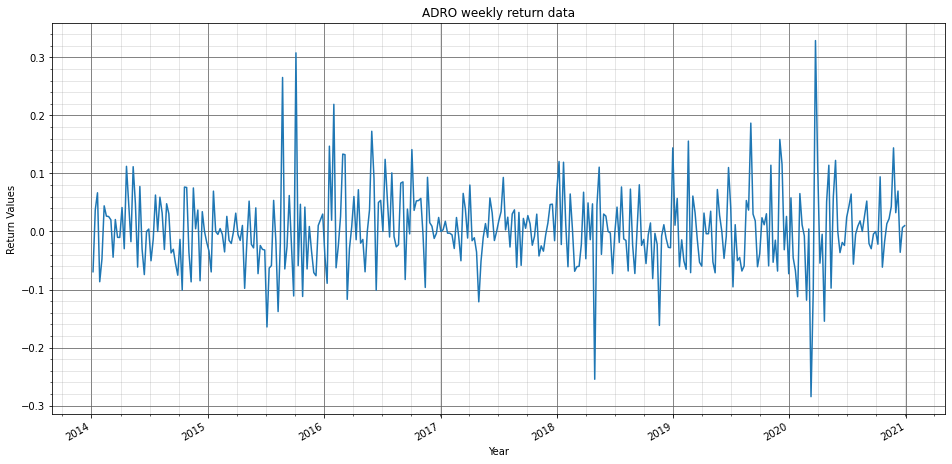

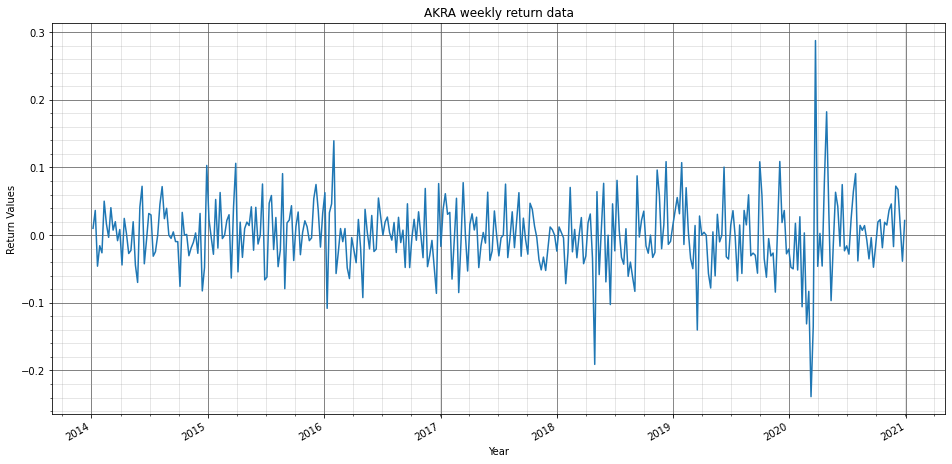

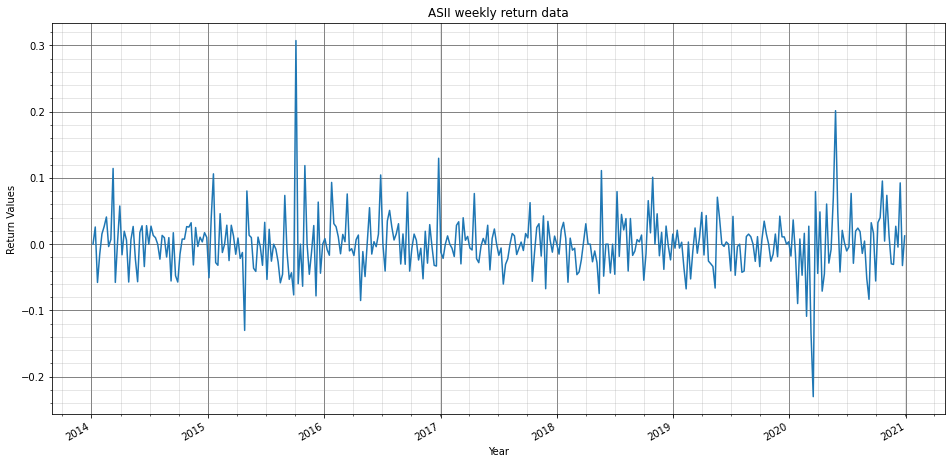

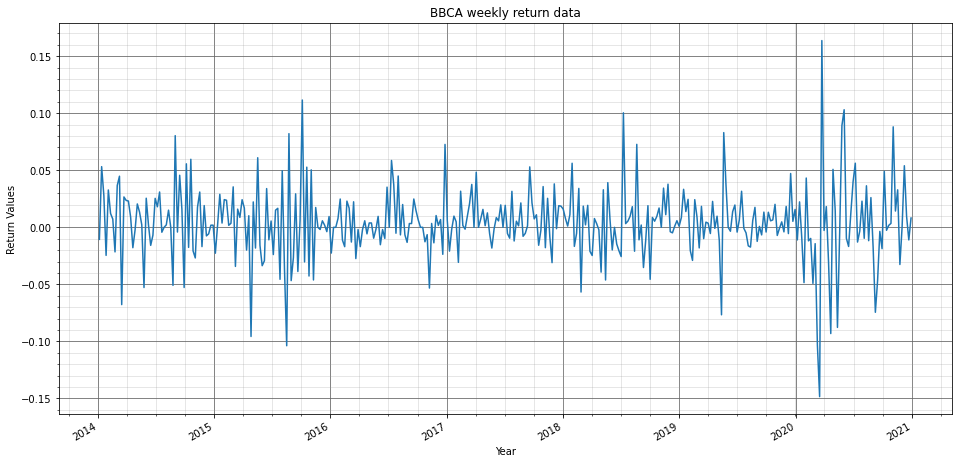

...

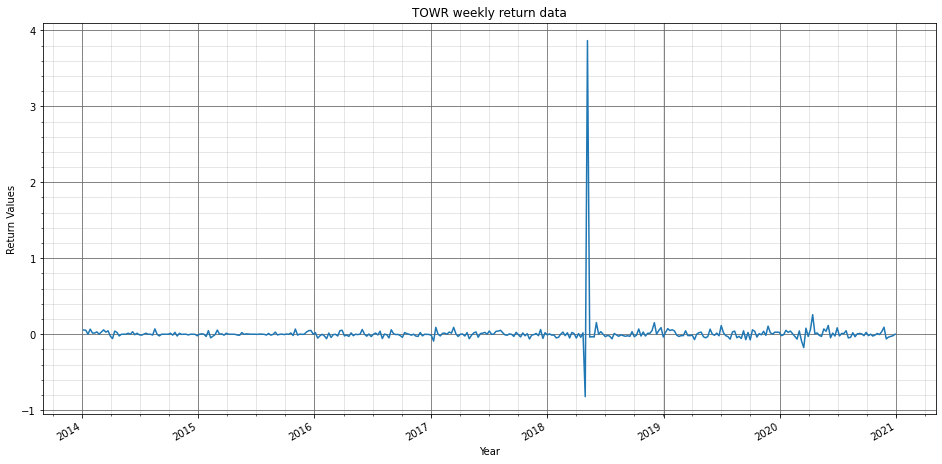

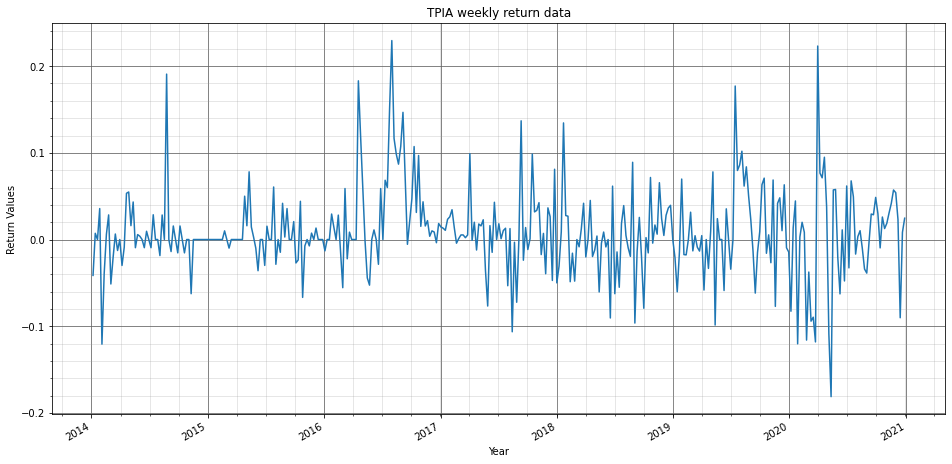

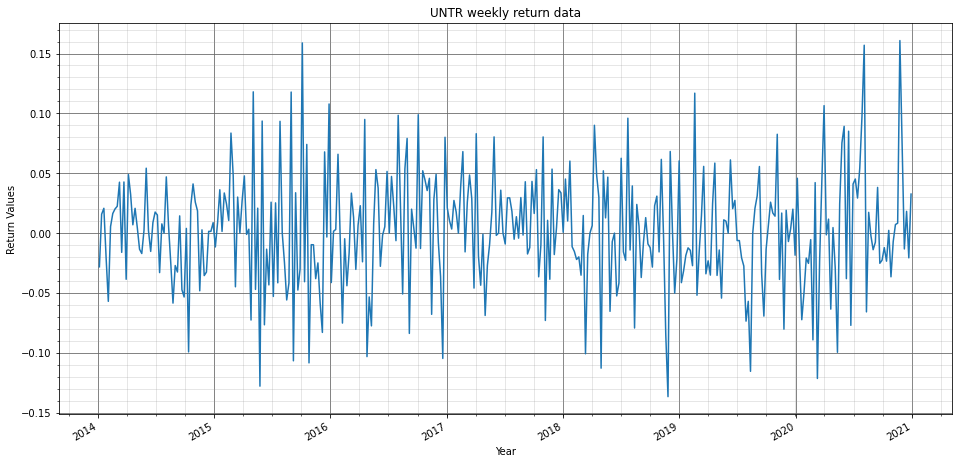

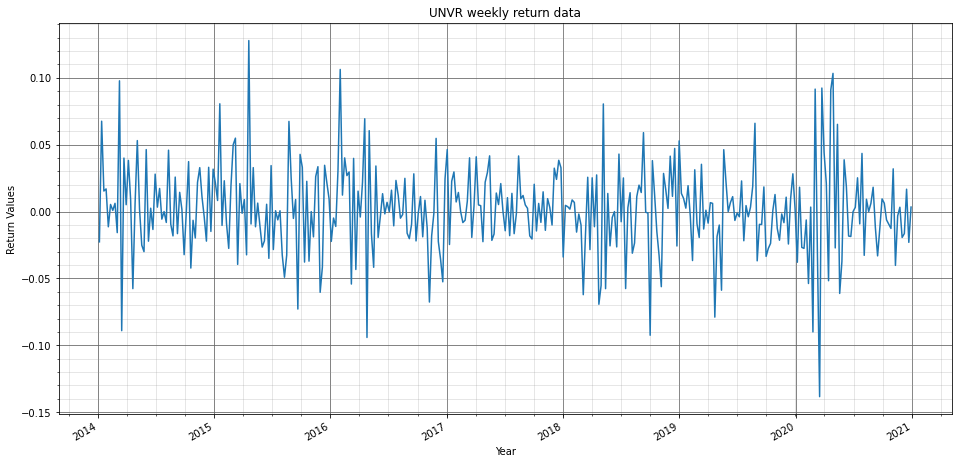

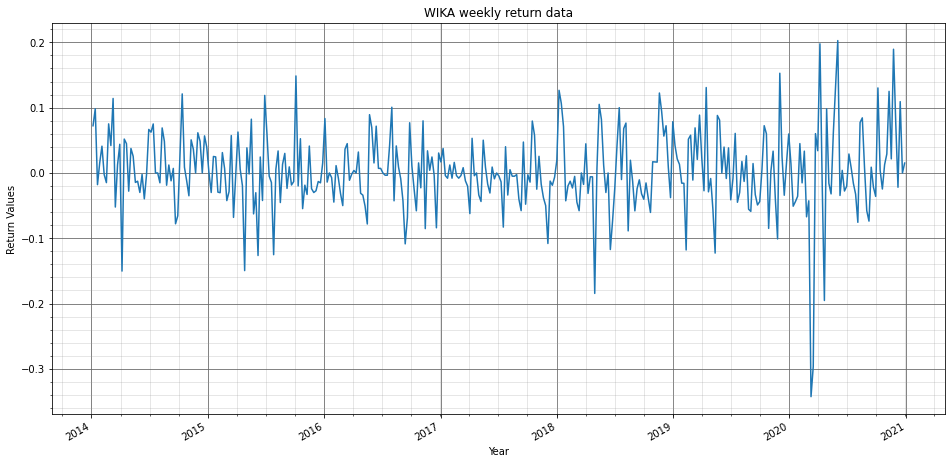

In [ ]:
import matplotlib.ticker

for i in range(1, len(return_saham.columns)):
  
  saham = data.columns[i]
  plt.figure(figsize=(16,8))
  plt.title(str(saham)+" weekly return data")
  plt.grid(True,  which='major', color='#666666', linestyle='-')
  plt.plot(return_weeklydate, return_saham[saham])
  plt.xlabel('Year')
  plt.ylabel('Return Values')
  plt.minorticks_on()
  plt.xticks(rotation = 50)
  plt.gcf().autofmt_xdate()
  plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.3)
  # plt.savefig(str(saham)+" weekly return data")
  plt.show()

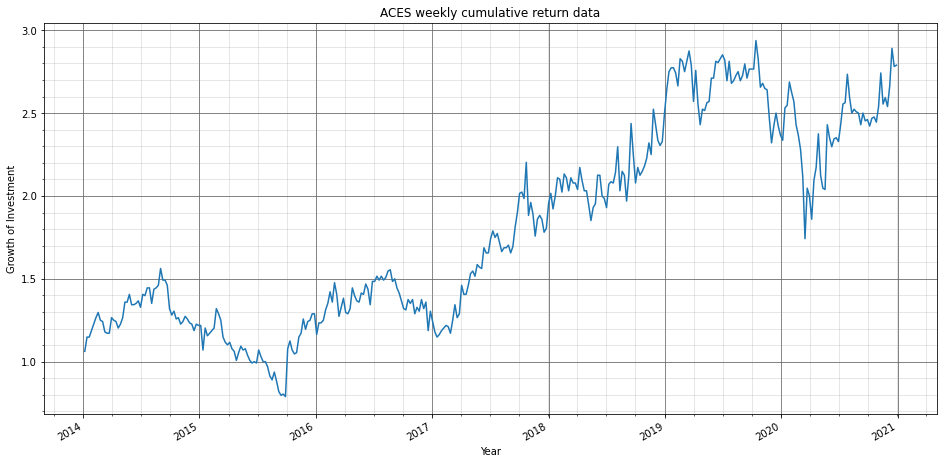

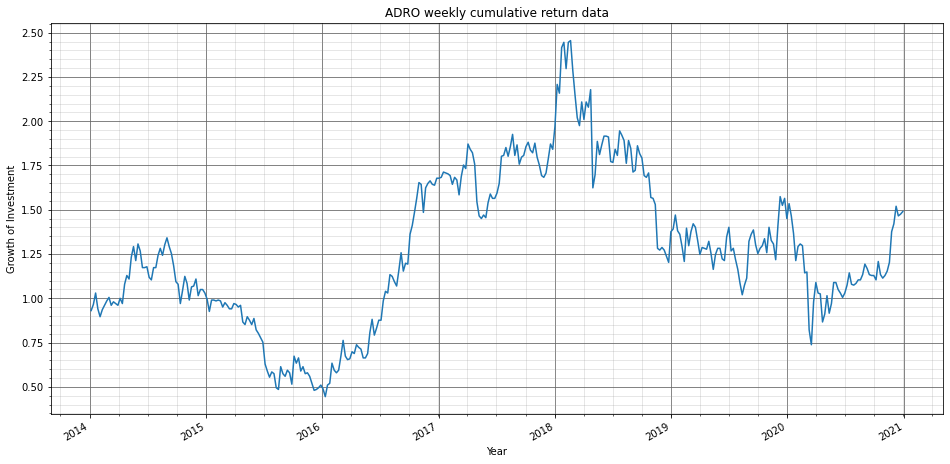

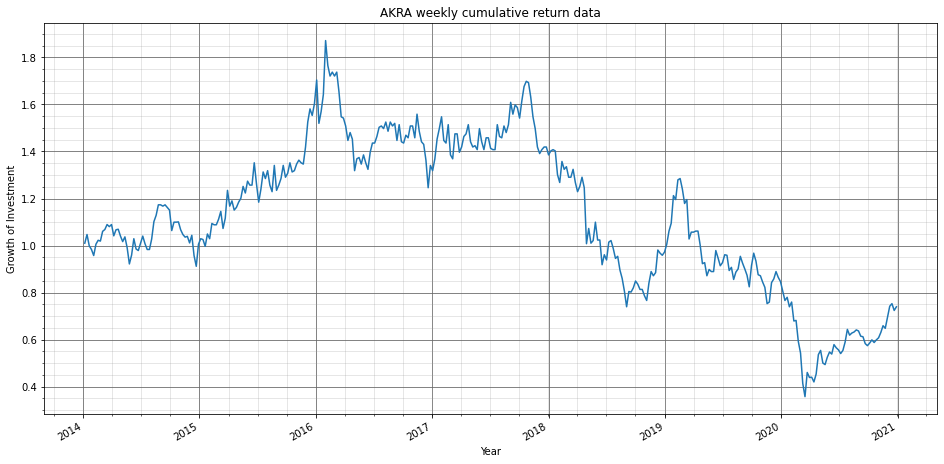

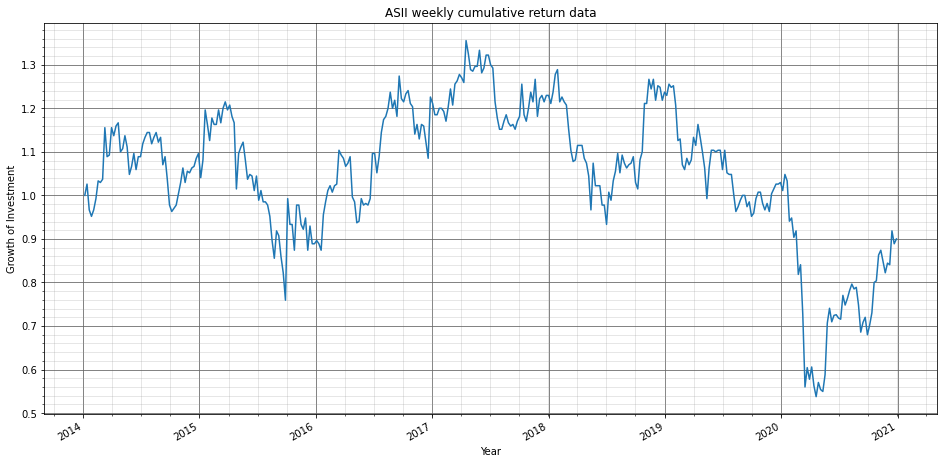

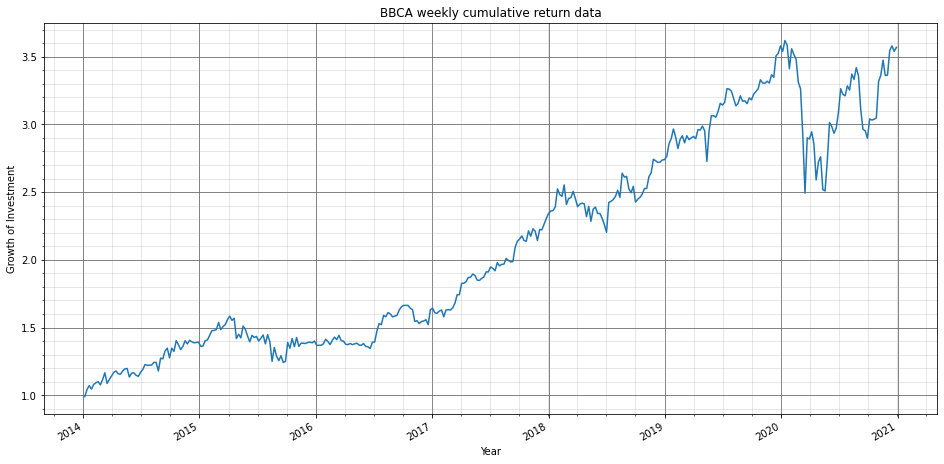

...

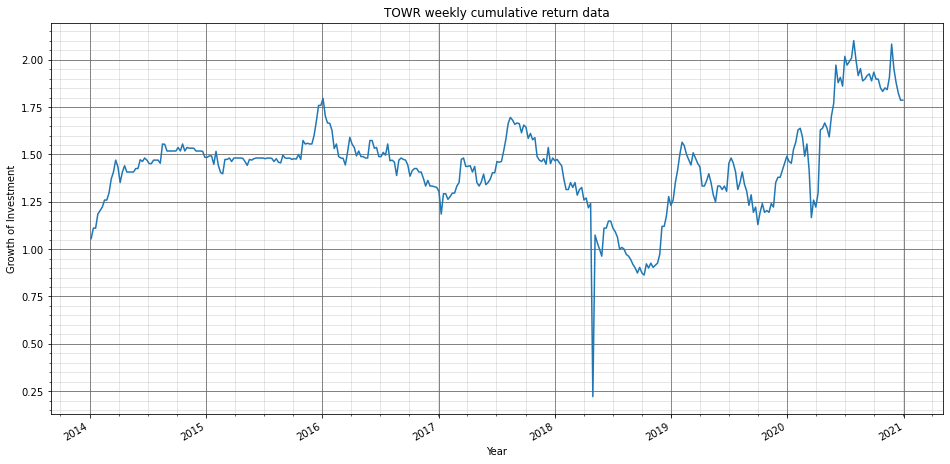

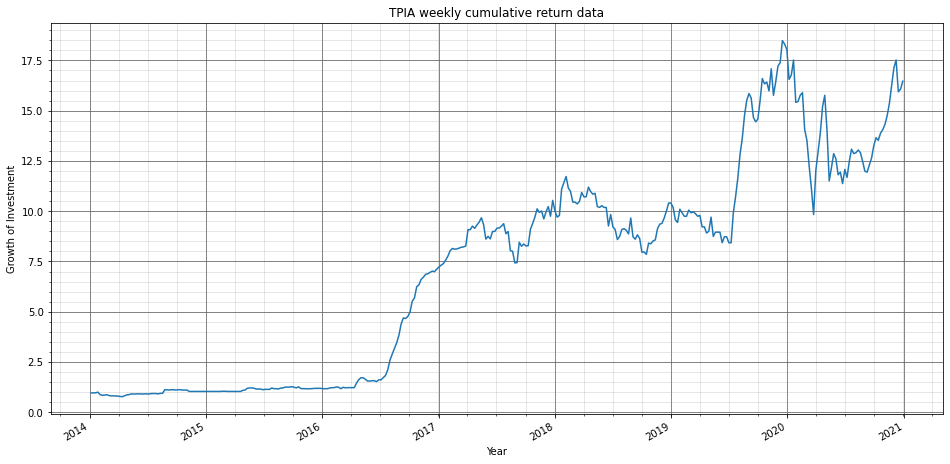

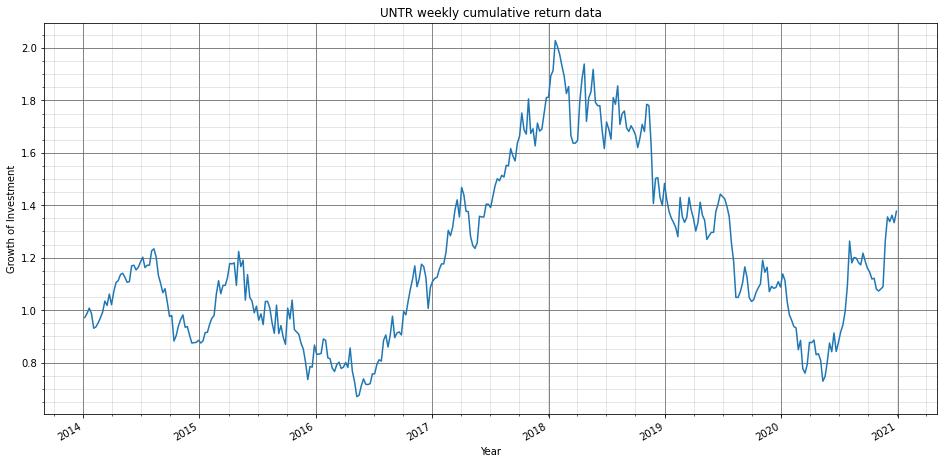

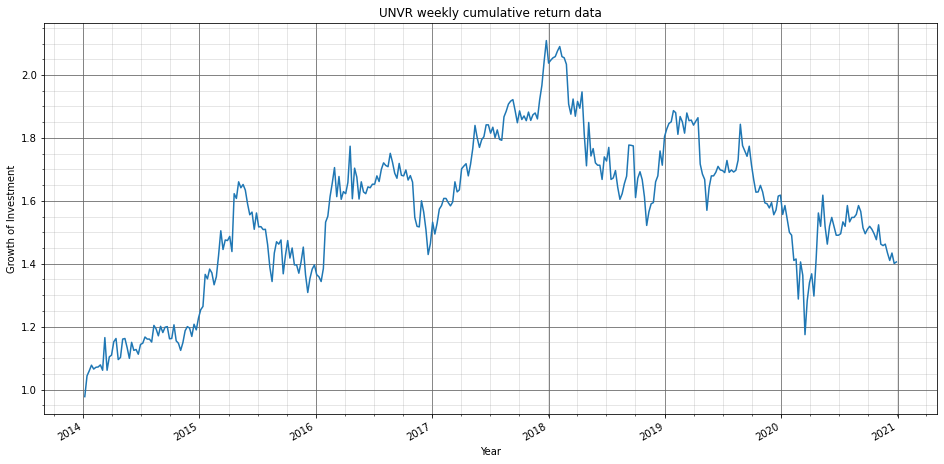

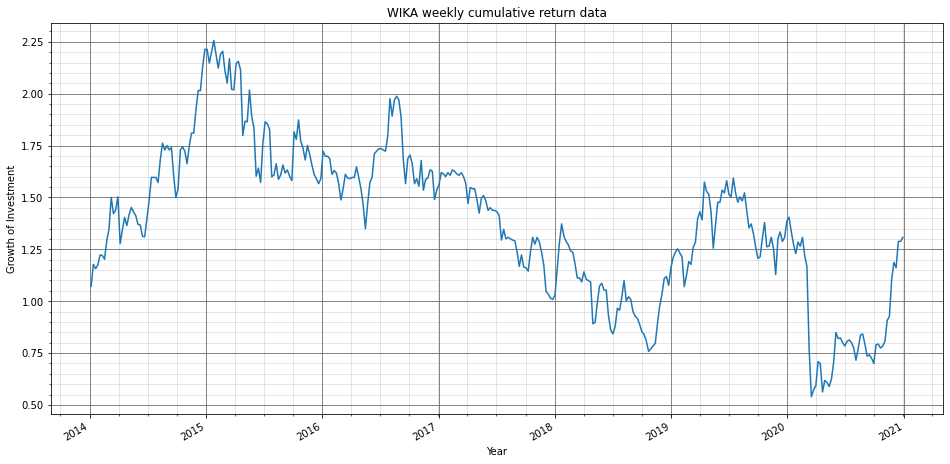

In [ ]:
for i in range(1, len(cum_return_shm.columns)):
  
  saham = data.columns[i]
  plt.figure(figsize=(16,8))
  plt.title(str(saham)+" weekly cumulative return data")
  plt.grid(True,  which='major', color='#666666', linestyle='-')
  plt.plot(return_weeklydate, cum_return_shm[saham])
  plt.xlabel('Year')
  plt.ylabel('Growth of Investment')
  plt.minorticks_on()
  plt.xticks(rotation = 50)
  plt.gcf().autofmt_xdate()
  plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.3)
  # plt.savefig(str(saham)+" weekly cumulative return data")
  plt.show()

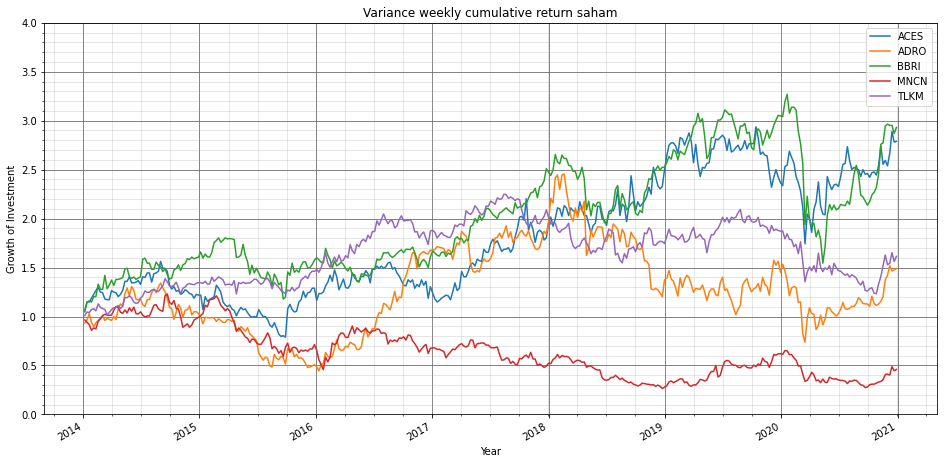

In [ ]:
plt.figure(figsize=(16,8))
plt.title("Variance weekly cumulative return saham")
plt.grid(True,  which='major', color='#666666', linestyle='-')
plt.plot(return_weeklydate, cum_return_shm['ACES'], label = "ACES")
plt.plot(return_weeklydate, cum_return_shm['ADRO'], label = "ADRO") 
plt.plot(return_weeklydate, cum_return_shm['BBRI'], label = "BBRI")
plt.plot(return_weeklydate, cum_return_shm['MNCN'], label = "MNCN")
plt.plot(return_weeklydate, cum_return_shm['TLKM'], label = "TLKM")
plt.ylim(0,4,0.5)
plt.xlabel('Year')
plt.ylabel('Growth of Investment')
plt.minorticks_on()
plt.xticks(rotation = 50)
plt.gcf().autofmt_xdate()
plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.3)
plt.legend()
# plt.savefig("Variance weekly cumulative return saham")
plt.show()

**Prediksi Saham**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

target_saham = pd.DataFrame()
# predict_saham = pd.DataFrame(weeklydate, columns=['Date'])
predict_saham = pd.DataFrame()
confidence_predict_saham = pd.DataFrame(index=['confidence'])

modelRF = RandomForestRegressor(n_estimators=160, random_state=2)

stack_target_saham = pd.DataFrame()
stack_predict_saham = pd.DataFrame()
stack_confidence_predict_saham = pd.DataFrame()

for l in range(1, (forecast_out // 4) + 1):
  
  stack = 4
  stack_idx = (len(data_prediksi) - forecast_out) + (l * stack)
  stack_predict = data_prediksi.iloc[:stack_idx,:]

  for i in range(1, len(data_prediksi.columns)):
  
    saham = data_prediksi.columns[i]
  
    weekly_predict = pd.DataFrame(stack_predict[['Date',saham]])
    weekly_predict['Prediction'] = stack_predict[[saham]].shift(-stack)
  
    ### Create the independent data set (X)  #######
    # Convert the dataframe to a numpy array
    X = np.array(weekly_predict.drop(['Date','Prediction'],1))
    # Remove the last 'n' rows
    X = X[:-stack]

    ### Create the dependent data set (y)  #####
    # Convert the dataframe to a numpy array 
    y = np.array(weekly_predict['Prediction'])
    # Get all of the y values except the last 'n' rows
    y = y[:-stack]

    # Split the data into 80% training and 20% testing
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

    # Train Random Forest model 
    modelRF.fit(x_train,y_train)

    # Now test the model as return score coefficient of Random Forest
    # Best possible score is 1.0
    confidenceR = modelRF.score(x_test, y_test)

    # Set x_forecast equal to the last 30 rows of the original data set from Adj. Close column
    x_forecast = np.array(weekly_predict.drop(['Date', 'Prediction'],1))[-stack:]

    # Prediction Model 
    prediction_RF = modelRF.predict(x_forecast)
  
    target_saham[saham] = y[-stack:]
    predict_saham[saham] = prediction_RF
    confidence_predict_saham[saham] = confidenceR

  stack_target_saham = stack_target_saham.append(target_saham, ignore_index=True)
  stack_predict_saham = stack_predict_saham.append(predict_saham, ignore_index=True)
  stack_confidence_predict_saham = stack_confidence_predict_saham.append(confidence_predict_saham, ignore_index=True)

In [ ]:
# "Dates"
apply_date = np.array(data_prediksi.iloc[-forecast_out:,:1])
apply_date = pd.DataFrame(apply_date, columns=['Date'])
target_saham = apply_date.join(stack_target_saham)
predict_saham = apply_date.join(stack_predict_saham)

In [ ]:
target_saham

,Date,ACES,ADRO,AKRA,ASII,BBCA,BBNI,BBRI,BBTN,BMRI,BSDE,CPIN,CTRA,ERAA,EXCL,GGRM,HMSP,ICBP,INCO,INDF,INKP,INTP,ITMG,JPFA,JSMR,KLBF,MEDC,MNCN,PGAS,PTBA,PTPP,PWON,SMGR,SMRA,TBIG,TKIM,TLKM,TOWR,TPIA,UNTR,UNVR,WIKA
0,09/12/2019,1550.0,1590.0,3840.0,6850.0,31800.0,7650.0,4280.0,2170.0,7375.0,1255.0,6800.0,1060.0,325.0,3240.0,52025.0,2060.0,11450.0,3490.0,7750.0,7875.0,20000.0,11050.0,1575.0,5225.0,1600.0,736.507935,1590.0,2130.0,2580.0,1650.0,570.0,12300.0,1030.0,1145.0,11300.0,3990.0,745.0,9900.0,21175.0,8245.0,2050.0
1,16/12/2019,1600.0,1540.0,3980.0,6925.0,33300.0,7800.0,4360.0,2130.0,7700.0,1280.0,6775.0,1085.0,330.0,3320.0,53100.0,2100.0,11525.0,3570.0,7925.0,7825.0,20000.0,11350.0,1535.0,5300.0,1610.0,732.275146,1575.0,2190.0,2600.0,1635.0,570.0,12375.0,995.0,1145.0,10850.0,4020.0,765.0,10525.0,21250.0,8325.0,1980.0
2,23/12/2019,1550.0,1580.0,3870.0,6925.0,33475.0,7925.0,4430.0,2150.0,7750.0,1275.0,6875.0,1045.0,359.0,3250.0,53250.0,2130.0,11175.0,3530.0,7925.0,7775.0,19775.0,11225.0,1575.0,5300.0,1615.0,749.206360,1610.0,2250.0,2650.0,1595.0,575.0,12225.0,990.0,1230.0,10475.0,3990.0,785.0,10425.0,21675.0,8560.0,2010.0
3,30/12/2019,1515.0,1465.0,3790.0,6950.0,34000.0,7800.0,4420.0,2150.0,7725.0,1290.0,6900.0,1050.0,362.0,3200.0,54100.0,2140.0,11250.0,3500.0,8025.0,8100.0,18875.0,11725.0,1535.0,5250.0,1635.0,770.370361,1615.0,2160.0,2670.0,1710.0,565.0,12325.0,1020.0,1220.0,11025.0,3980.0,805.0,10275.0,21275.0,8575.0,2130.0


In [ ]:
predict_saham

,Date,ACES,ADRO,AKRA,ASII,BBCA,BBNI,BBRI,BBTN,BMRI,BSDE,CPIN,CTRA,ERAA,EXCL,GGRM,HMSP,ICBP,INCO,INDF,INKP,INTP,ITMG,JPFA,JSMR,KLBF,MEDC,MNCN,PGAS,PTBA,PTPP,PWON,SMGR,SMRA,TBIG,TKIM,TLKM,TOWR,TPIA,UNTR,UNVR,WIKA
0,09/12/2019,1588.875000,1425.021354,3978.687500,7593.927455,33646.875,7532.618862,4099.702604,2226.859375,7207.975074,1282.023958,6824.947917,911.797232,297.966555,2850.340231,50984.375000,2111.46875,11398.968006,3332.185417,7710.458480,8190.919271,21564.822545,10273.43750,1503.625000,5471.707550,1558.137388,796.805016,1708.00000,2063.958333,2567.292894,1778.917148,583.966814,11322.734003,1214.522396,1158.637773,11213.593750,3777.724752,755.025417,10117.708333,19380.937500,8173.718750,2071.184659
1,16/12/2019,1692.777604,1405.018229,4180.768601,6939.447173,33646.875,7690.937500,4426.192857,2247.056250,7784.475152,1476.140625,6934.635417,971.466494,311.585536,3411.611604,53832.791667,2005.75000,11531.790179,3485.463393,8058.600351,7827.630208,21564.822545,10565.93750,1625.978125,5776.926812,1625.629167,773.179371,1536.93750,2102.321875,2334.126910,1765.482419,583.966814,12523.799107,946.765483,1158.637773,10609.179688,3785.662500,793.743881,10117.708333,22494.687500,8855.640625,1979.892810
2,23/12/2019,1588.875000,1638.495585,4281.943750,6939.447173,33646.875,7749.364583,4115.750000,2388.849479,7373.053571,1419.265625,6807.848958,1112.536252,371.081250,3181.854305,52917.612351,2054.59375,11449.726935,3381.421875,8058.600351,8336.536458,20077.970486,9900.00000,1503.625000,5776.926812,1602.007738,731.178839,1700.40625,2192.252799,2541.843750,1575.328212,557.974628,11218.872396,892.310528,1226.412396,10241.638021,3777.724752,734.213571,10117.708333,22738.880208,8728.347917,1866.968510
3,30/12/2019,1692.125000,1575.593750,3746.937500,7130.875000,33646.875,7690.937500,4134.225000,2388.849479,7373.053571,1456.156250,6961.911458,1148.865033,423.506250,3546.176713,55513.906250,2065.21875,11449.726935,3309.534375,7712.003720,7198.666295,17850.171131,10839.21875,1625.978125,5012.679098,1602.579911,757.574952,1742.56250,1957.673239,2487.906250,1831.685078,574.888968,11322.734003,1031.186445,1176.063123,10743.085938,4047.746280,817.472955,10117.708333,22296.875000,8797.175818,2030.967642


In [ ]:
# Confidences RF Regression / execution
stack_confidence_predict_saham

,ACES,ADRO,AKRA,ASII,BBCA,BBNI,BBRI,BBTN,BMRI,BSDE,CPIN,CTRA,ERAA,EXCL,GGRM,HMSP,ICBP,INCO,INDF,INKP,INTP,ITMG,JPFA,JSMR,KLBF,MEDC,MNCN,PGAS,PTBA,PTPP,PWON,SMGR,SMRA,TBIG,TKIM,TLKM,TOWR,TPIA,UNTR,UNVR,WIKA
0,0.956805,0.82518,0.828399,0.513844,0.985896,0.844323,0.930968,0.943815,0.83828,0.715189,0.855677,0.504508,0.781952,0.795795,0.809316,0.8562,0.949114,0.755167,0.61256,0.956825,0.513981,0.861368,0.861128,0.68522,0.673667,0.829633,0.855818,0.955672,0.895178,0.880183,0.818289,0.868536,0.810779,0.880198,0.95824,0.919969,0.231316,0.967228,0.894171,0.842654,0.82159


In [ ]:
# Predicted data scaling from 0 to 1 (there is a zero value)
scaling_data = predict_saham.iloc[:,1:].apply(lambda x: (x - x.min()) / (x.max() - x.min()))
scaling_data

,ACES,ADRO,AKRA,ASII,BBCA,BBNI,BBRI,BBTN,BMRI,BSDE,CPIN,CTRA,ERAA,EXCL,GGRM,HMSP,ICBP,INCO,INDF,INKP,INTP,ITMG,JPFA,JSMR,KLBF,MEDC,MNCN,PGAS,PTBA,PTPP,PWON,SMGR,SMRA,TBIG,TKIM,TLKM,TOWR,TPIA,UNTR,UNVR,WIKA
0,0.000000,0.085675,0.433173,1.000000,NaN,0.000000,0.000000,0.00000,0.000000,0.000000,0.110987,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.128751,0.000000,0.872027,1.000000,0.397604,0.0,0.600628,0.000000,1.000000,0.831915,0.453088,1.000000,0.794162,1.000000,0.079592,1.000000,0.000000,1.000000,0.000000,0.249964,NaN,0.000000,0.000000,1.000000
1,1.000000,0.000000,0.810890,0.000000,NaN,0.730435,1.000000,0.12468,1.000000,1.000000,0.822955,0.251697,0.108483,0.806614,0.628855,0.000000,1.000000,1.000000,1.000000,0.552755,1.000000,0.709033,1.0,1.000000,1.000000,0.639997,0.000000,0.616629,0.000000,0.741756,1.000000,1.000000,0.169004,0.000000,0.378147,0.029397,0.714998,NaN,0.927279,1.000000,0.552965
2,0.000000,1.000000,1.000000,0.000000,NaN,1.000000,0.049151,1.00000,0.286346,0.707006,0.000000,0.846758,0.582403,0.476425,0.426807,0.462016,0.382157,0.408617,1.000000,1.000000,0.599733,0.000000,0.0,1.000000,0.650010,0.000000,0.794985,1.000000,0.890854,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,NaN,1.000000,0.813332,0.000000
3,0.993719,0.730587,0.000000,0.292488,NaN,0.730435,0.105738,1.00000,0.286346,0.897050,1.000000,1.000000,1.000000,1.000000,1.000000,0.562518,0.382157,0.000000,0.004439,0.000000,0.000000,1.000000,1.0,0.000000,0.658488,0.402219,1.000000,0.000000,0.659527,1.000000,0.650747,0.079592,0.431008,0.257107,0.515916,1.000000,1.000000,NaN,0.868370,0.914265,0.803066


In [ ]:
# Scaling data using StandardScaler (is not a scaling from 0 to 1)
from sklearn.preprocessing import StandardScaler

# men-scaling hasil prediksi
scaling = StandardScaler()
scaling_predict = scaling.fit_transform(predict_saham.iloc[:,1:])
scaling_predict = pd.DataFrame(scaling_predict)
scaling_predict

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40
0,-0.999990,-0.870487,-0.333945,1.656452,0.0,-1.654462,-0.700175,-1.127994,-1.064529,-1.668062,-0.857656,-1.272869,-1.059966,-1.505994,-1.423722,1.389656,-1.230586,-0.664001,-1.004443,0.688628,0.855332,-0.347613,-1.0,-0.121025,-1.594795,1.346245,0.452741,-0.179387,0.933792,0.423157,0.826128,-0.511045,1.583441,-0.767314,1.471143,-0.599969,-0.618640,0.0,-1.720604,-1.708164,1.095527
1,1.006291,-1.072931,0.652708,-0.790743,0.0,0.309846,1.724906,-0.863224,1.643004,0.894190,0.781609,-0.662177,-0.787946,0.622319,0.318421,-1.424174,1.559362,1.599423,0.999995,-0.138435,0.855332,0.491229,1.0,0.854842,1.168551,0.356038,-1.697167,0.276575,-1.642864,0.284715,0.826128,1.726638,-0.609626,-0.767314,-0.266488,-0.531435,0.573721,0.0,0.562200,0.796845,-0.096075
2,-0.999990,1.290013,1.146691,-0.790743,0.0,1.034769,-0.580979,0.995609,-0.289238,0.143466,-1.113198,0.781618,0.400398,-0.248909,-0.241319,-0.124140,-0.164388,0.063063,0.999995,1.020139,-0.122656,-1.418572,-1.0,0.854842,0.201409,-1.404304,0.357303,1.345430,0.652561,-1.674794,-1.623013,-0.704548,-1.055640,1.674209,-1.323134,-0.599969,-1.259555,0.0,0.741227,0.329241,-1.570039
3,0.993689,0.653405,-1.465454,-0.074967,0.0,0.309846,-0.443752,0.995609,-0.289238,0.630406,1.189245,1.153429,1.447514,1.132584,1.346621,0.158657,-0.164388,-0.998485,-0.995547,-1.570332,-1.588008,1.274956,1.0,-1.588660,0.224835,-0.297980,0.887122,-1.442617,0.056511,0.966923,-0.029242,-0.511045,0.081825,-0.139581,0.118479,1.731373,1.304474,0.0,0.417177,0.582077,0.570587


In [ ]:
# Please choose which scaling you want to use!
scaling_predict_saham = pd.DataFrame(predict_saham['Date'])

for i in range(len(scaling_predict.columns)):
  saham = data.columns[i+1]
  scaling_predict_saham[saham] = scaling_predict[i] 

In [ ]:
scaling_predict_saham

,Date,ACES,ADRO,AKRA,ASII,BBCA,BBNI,BBRI,BBTN,BMRI,BSDE,CPIN,CTRA,ERAA,EXCL,GGRM,HMSP,ICBP,INCO,INDF,INKP,INTP,ITMG,JPFA,JSMR,KLBF,MEDC,MNCN,PGAS,PTBA,PTPP,PWON,SMGR,SMRA,TBIG,TKIM,TLKM,TOWR,TPIA,UNTR,UNVR,WIKA
0,09/12/2019,-0.999990,-0.870487,-0.333945,1.656452,0.0,-1.654462,-0.700175,-1.127994,-1.064529,-1.668062,-0.857656,-1.272869,-1.059966,-1.505994,-1.423722,1.389656,-1.230586,-0.664001,-1.004443,0.688628,0.855332,-0.347613,-1.0,-0.121025,-1.594795,1.346245,0.452741,-0.179387,0.933792,0.423157,0.826128,-0.511045,1.583441,-0.767314,1.471143,-0.599969,-0.618640,0.0,-1.720604,-1.708164,1.095527
1,16/12/2019,1.006291,-1.072931,0.652708,-0.790743,0.0,0.309846,1.724906,-0.863224,1.643004,0.894190,0.781609,-0.662177,-0.787946,0.622319,0.318421,-1.424174,1.559362,1.599423,0.999995,-0.138435,0.855332,0.491229,1.0,0.854842,1.168551,0.356038,-1.697167,0.276575,-1.642864,0.284715,0.826128,1.726638,-0.609626,-0.767314,-0.266488,-0.531435,0.573721,0.0,0.562200,0.796845,-0.096075
2,23/12/2019,-0.999990,1.290013,1.146691,-0.790743,0.0,1.034769,-0.580979,0.995609,-0.289238,0.143466,-1.113198,0.781618,0.400398,-0.248909,-0.241319,-0.124140,-0.164388,0.063063,0.999995,1.020139,-0.122656,-1.418572,-1.0,0.854842,0.201409,-1.404304,0.357303,1.345430,0.652561,-1.674794,-1.623013,-0.704548,-1.055640,1.674209,-1.323134,-0.599969,-1.259555,0.0,0.741227,0.329241,-1.570039
3,30/12/2019,0.993689,0.653405,-1.465454,-0.074967,0.0,0.309846,-0.443752,0.995609,-0.289238,0.630406,1.189245,1.153429,1.447514,1.132584,1.346621,0.158657,-0.164388,-0.998485,-0.995547,-1.570332,-1.588008,1.274956,1.0,-1.588660,0.224835,-0.297980,0.887122,-1.442617,0.056511,0.966923,-0.029242,-0.511045,0.081825,-0.139581,0.118479,1.731373,1.304474,0.0,0.417177,0.582077,0.570587


**Visualisasi Data Hasil Prediksi**

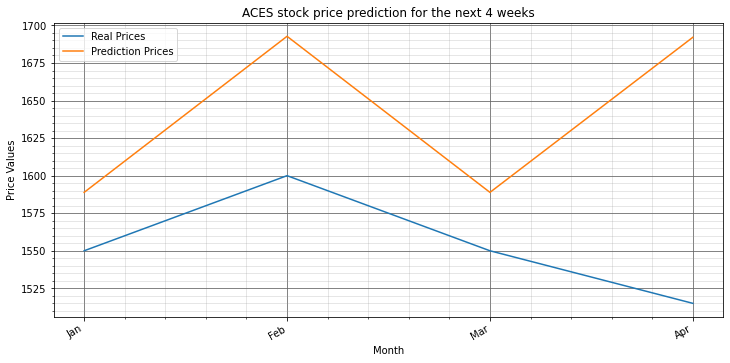

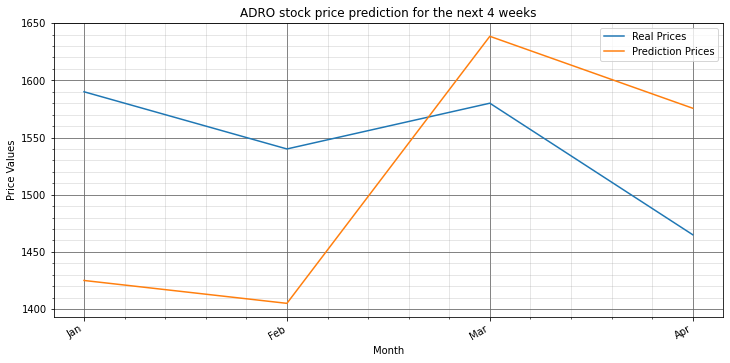

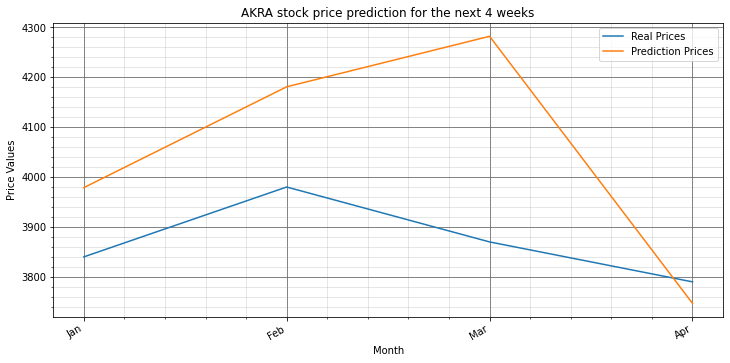

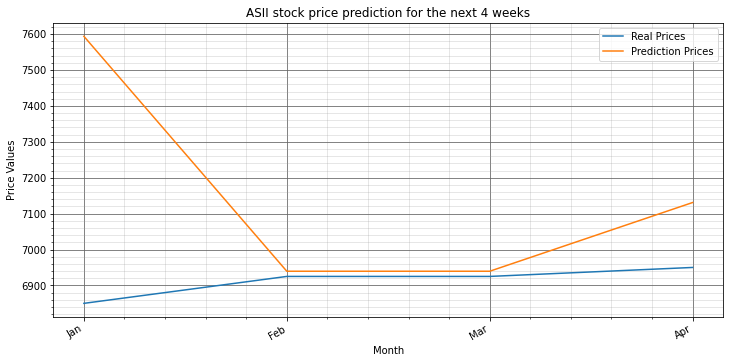

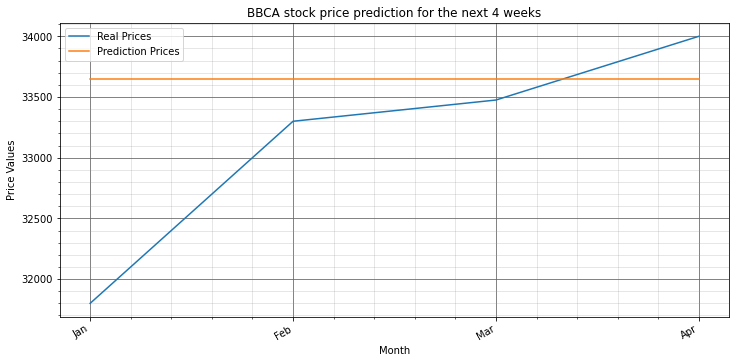

...

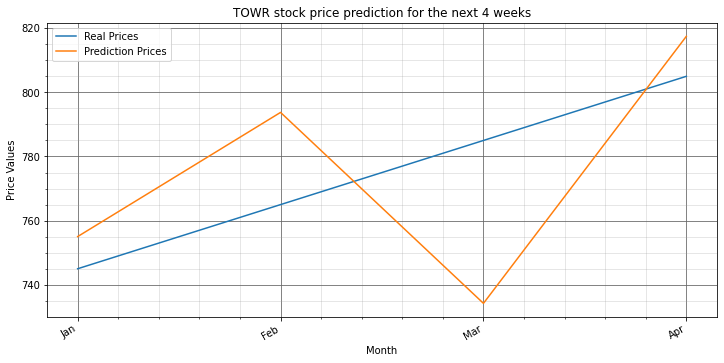

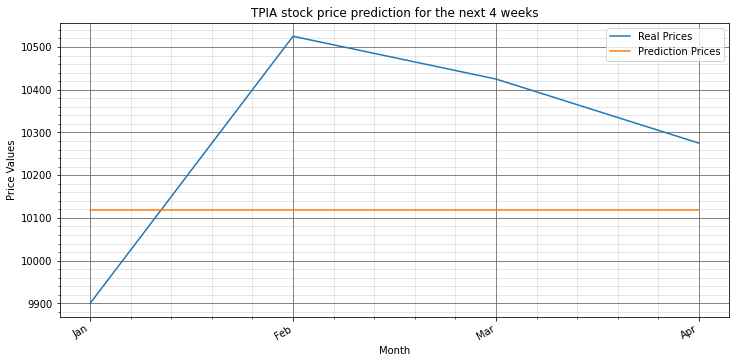

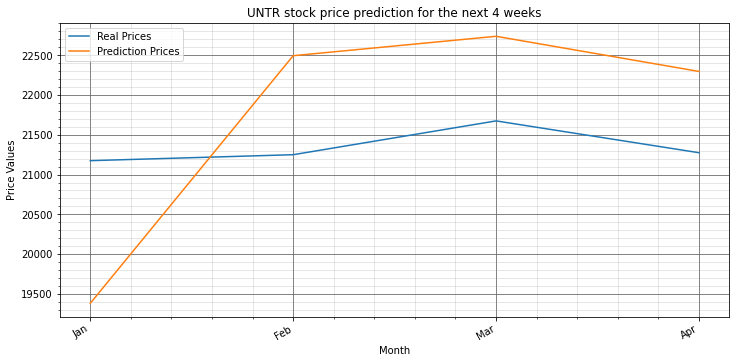

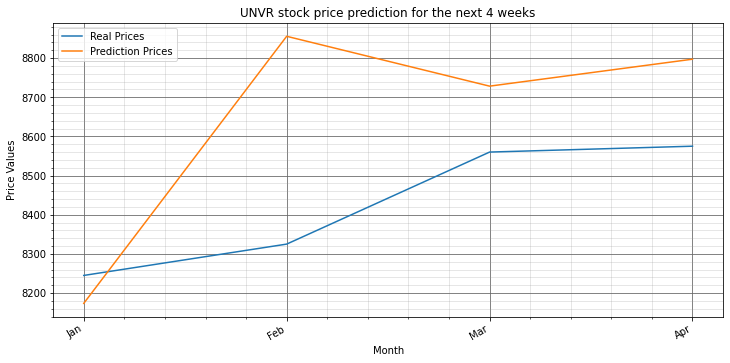

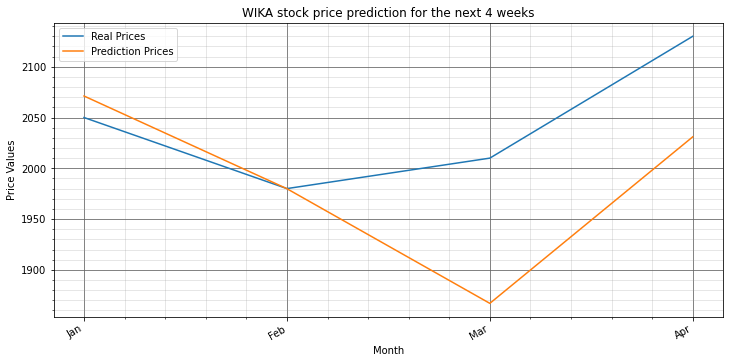

In [ ]:
for i in range(1, len(predict_saham.columns)):
  
  saham = data.columns[i]
  plt.figure(figsize=(12,6))
  
  xlabels = ('Jan', 'Feb', 'Mar', 'Apr', 'Mei')
  xpos = np.array([0,1,2,3])

  plt.title(str(saham)+" stock price prediction for the next 4 weeks")
  plt.grid(True,  which='major', color='#666666', linestyle='-')
  plt.plot(target_saham[saham], label = "Real Prices")
  plt.plot(predict_saham[saham], label = "Prediction Prices")
  plt.xlabel('Month')
  plt.ylabel('Price Values')
  plt.xticks(xpos, xlabels)
  plt.minorticks_on()
  plt.gcf().autofmt_xdate()
  plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.3)
  plt.legend()
  # plt.savefig(str(saham)+" stock price prediction for the next 4 weeks")
  plt.show()

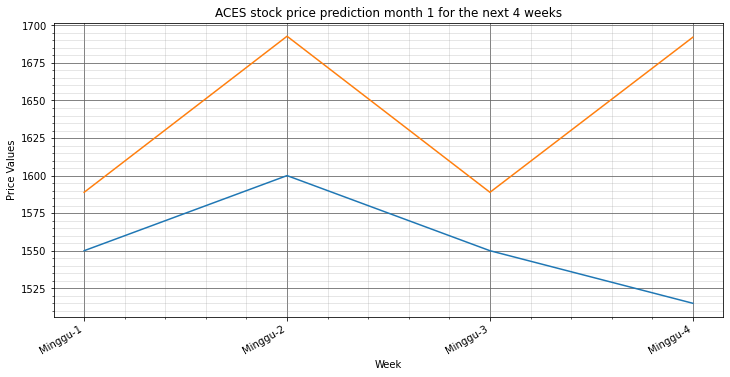

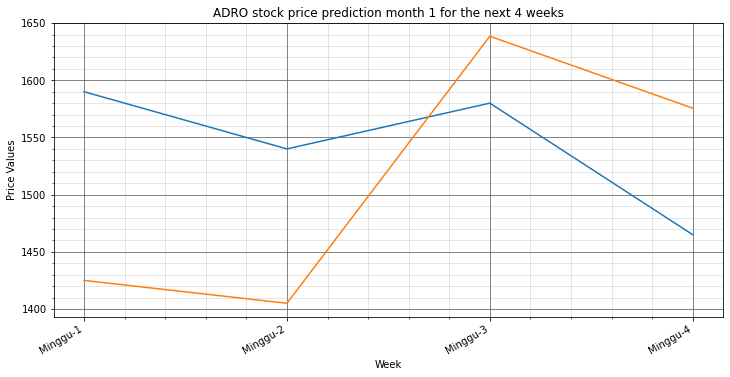

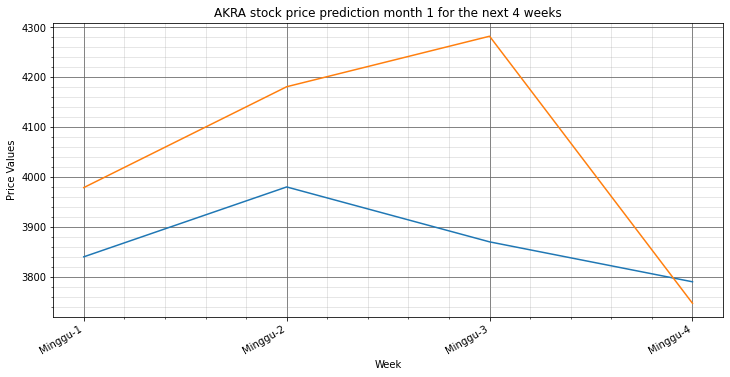

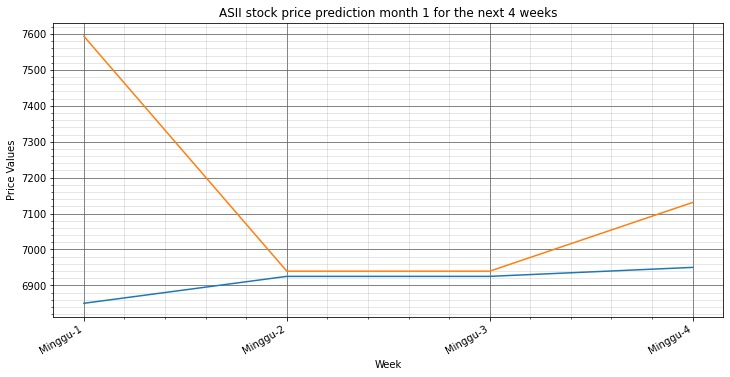

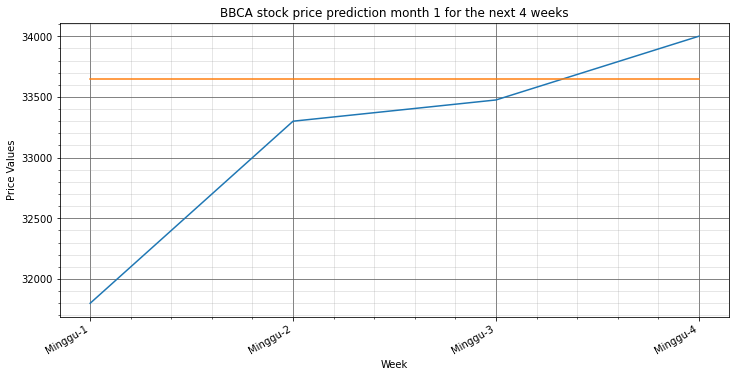

...

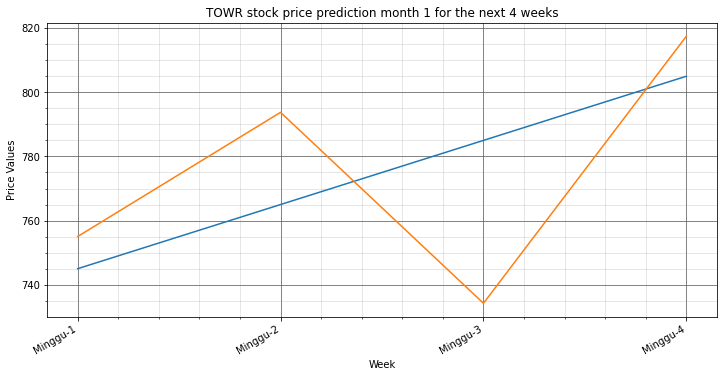

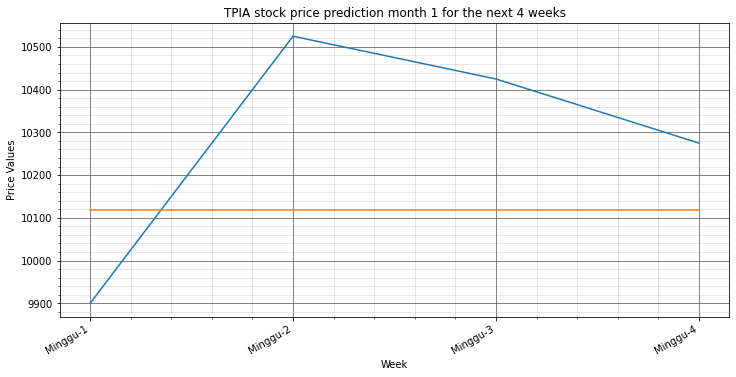

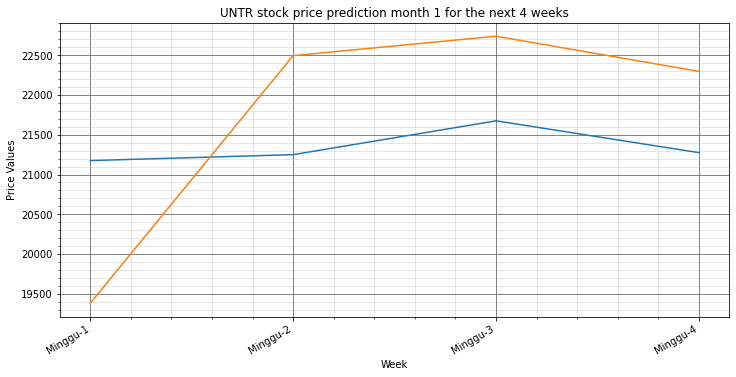

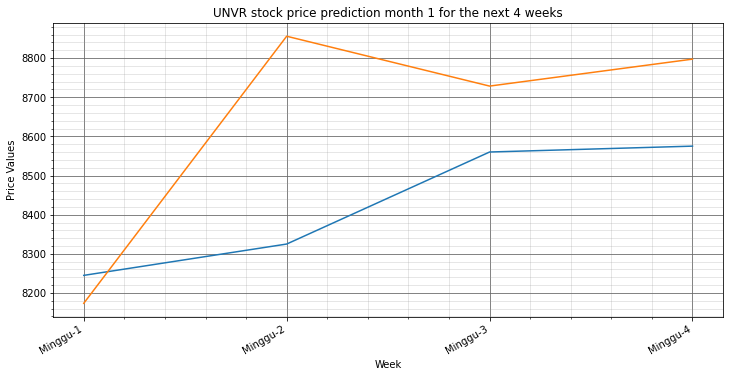

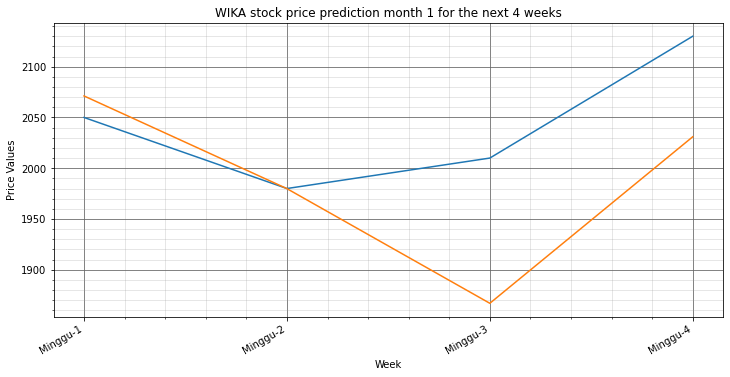

In [ ]:
for i in range(1, len(predict_saham.columns)):
  for l in range(0,1):

    saham = data.columns[i]
    plt.figure(figsize=(12,6))
  
    stack = 4
    first = stack * l
    second = stack * (l+1)
    target_stack = target_saham.iloc[first:second,:]
    predict_stack = predict_saham.iloc[first:second,:] 

    target_stacks = pd.DataFrame()
    predict_stacks = pd.DataFrame()
    target_stacks = target_stacks.append(target_stack, ignore_index=True)    
    predict_stacks = predict_stacks.append(predict_stack, ignore_index=True)

    xlabels = ('Minggu-1', 'Minggu-2', 'Minggu-3', 'Minggu-4')
    xpos = np.arange(len(xlabels))
  
    plt.title(str(saham)+" stock price prediction month "+str(l+1)+" for the next 4 weeks")
    plt.grid(True,  which='major', color='#666666', linestyle='-')
    plt.plot(target_stacks[saham], label="Real Prices")
    plt.plot(predict_stacks[saham], label="Prediction Prices")
    plt.xlabel('Week')
    plt.ylabel('Price Values')
    plt.minorticks_on()
    plt.xticks(xpos, xlabels)
    plt.gcf().autofmt_xdate()
    plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.3)
    # plt.savefig(str(saham)+" stock price prediction month "+str(l+1)+" for the next 4 weeks")
    plt.show()

**Prediksi *Mean Absolute Precentage Error* (MAPE)**

In [ ]:
# Looking for the mape value based on the stock prediction results
mape_predict = pd.DataFrame()
mape_predict_saham = pd.DataFrame()

for l in range(0, (forecast_out // 4)):

  mape_stack = 4
  mape_first_idx = mape_stack * l
  mape_last_idx = mape_stack * (l + 1)
  target_data = target_saham.iloc[mape_first_idx:mape_last_idx,:]
  predict_data = predict_saham.iloc[mape_first_idx:mape_last_idx,:]

  for i in range(1, len(predict_saham.columns)):
  
    saham = data_prediksi.columns[i]
    target, predict = np.array(target_data[saham]), np.array(predict_data[saham]) 
    mape_manual = np.mean(np.abs((target - predict) / target))
    mape_manual = [mape_manual * 100]
    mape_predict[saham] = mape_manual

  mape_predict_saham = mape_predict_saham.append(mape_predict, ignore_index=True)    

In [ ]:
# The best value is close to zero
mape_predict_saham

,ACES,ADRO,AKRA,ASII,BBCA,BBNI,BBRI,BBTN,BMRI,BSDE,CPIN,CTRA,ERAA,EXCL,GGRM,HMSP,ICBP,INCO,INDF,INKP,INTP,ITMG,JPFA,JSMR,KLBF,MEDC,MNCN,PGAS,PTBA,PTPP,PWON,SMGR,SMRA,TBIG,TKIM,TLKM,TOWR,TPIA,UNTR,UNVR,WIKA
0,5.626537,7.598095,5.109211,3.470005,2.100374,1.636772,4.822479,7.583601,3.195398,10.418018,1.149283,10.080957,8.563513,6.925184,1.654492,3.505307,1.184592,4.135192,1.945524,5.598799,5.652468,8.3236,5.22933,6.809828,1.593631,4.459989,5.837988,4.759409,5.404943,6.035791,2.402958,6.377432,8.431705,1.568801,1.942261,4.542956,3.280527,2.636822,6.010351,2.949063,3.201053


**Return Hasil Prediksi**

In [ ]:
data_hsl_predict = data_prediksi[:310]
data_hsl_predict = data_hsl_predict.append(predict_saham, ignore_index=True)

In [ ]:
data_hsl_predict.tail()

,Date,ACES,ADRO,AKRA,ASII,BBCA,BBNI,BBRI,BBTN,BMRI,BSDE,CPIN,CTRA,ERAA,EXCL,GGRM,HMSP,ICBP,INCO,INDF,INKP,INTP,ITMG,JPFA,JSMR,KLBF,MEDC,MNCN,PGAS,PTBA,PTPP,PWON,SMGR,SMRA,TBIG,TKIM,TLKM,TOWR,TPIA,UNTR,UNVR,WIKA
309,02/12/2019,1485.000000,1425.000000,3770.000000,6775.000000,31975.000,7575.000000,4170.000000,2170.000000,7175.000000,1255.000000,6900.000000,1000.000000,304.000000,3400.000000,52800.000000,2080.00000,11425.000000,3170.000000,8000.000000,7950.000000,20700.000000,10100.00000,1585.000000,5175.000000,1570.000000,622.222229,1395.00000,2140.000000,2550.000000,1575.000000,565.000000,12425.000000,995.000000,1095.000000,11650.000000,4100.000000,745.000000,9800.000000,21325.000000,8450.000000,2000.000000
310,09/12/2019,1588.875000,1425.021354,3978.687500,7593.927455,33646.875,7532.618862,4099.702604,2226.859375,7207.975074,1282.023958,6824.947917,911.797232,297.966555,2850.340231,50984.375000,2111.46875,11398.968006,3332.185417,7710.458480,8190.919271,21564.822545,10273.43750,1503.625000,5471.707550,1558.137388,796.805016,1708.00000,2063.958333,2567.292894,1778.917148,583.966814,11322.734003,1214.522396,1158.637773,11213.593750,3777.724752,755.025417,10117.708333,19380.937500,8173.718750,2071.184659
311,16/12/2019,1692.777604,1405.018229,4180.768601,6939.447173,33646.875,7690.937500,4426.192857,2247.056250,7784.475152,1476.140625,6934.635417,971.466494,311.585536,3411.611604,53832.791667,2005.75000,11531.790179,3485.463393,8058.600351,7827.630208,21564.822545,10565.93750,1625.978125,5776.926812,1625.629167,773.179371,1536.93750,2102.321875,2334.126910,1765.482419,583.966814,12523.799107,946.765483,1158.637773,10609.179688,3785.662500,793.743881,10117.708333,22494.687500,8855.640625,1979.892810
312,23/12/2019,1588.875000,1638.495585,4281.943750,6939.447173,33646.875,7749.364583,4115.750000,2388.849479,7373.053571,1419.265625,6807.848958,1112.536252,371.081250,3181.854305,52917.612351,2054.59375,11449.726935,3381.421875,8058.600351,8336.536458,20077.970486,9900.00000,1503.625000,5776.926812,1602.007738,731.178839,1700.40625,2192.252799,2541.843750,1575.328212,557.974628,11218.872396,892.310528,1226.412396,10241.638021,3777.724752,734.213571,10117.708333,22738.880208,8728.347917,1866.968510
313,30/12/2019,1692.125000,1575.593750,3746.937500,7130.875000,33646.875,7690.937500,4134.225000,2388.849479,7373.053571,1456.156250,6961.911458,1148.865033,423.506250,3546.176713,55513.906250,2065.21875,11449.726935,3309.534375,7712.003720,7198.666295,17850.171131,10839.21875,1625.978125,5012.679098,1602.579911,757.574952,1742.56250,1957.673239,2487.906250,1831.685078,574.888968,11322.734003,1031.186445,1176.063123,10743.085938,4047.746280,817.472955,10117.708333,22296.875000,8797.175818,2030.967642


In [ ]:
return_hsl_weeklydate = pd.to_datetime(data_hsl_predict.Date)
return_hsl_weeklydate = return_hsl_weeklydate.dt.strftime("%d-%m-%Y")
return_hsl_weeklydate = pd.to_datetime(return_hsl_weeklydate)
return_hsl_weeklydate

0     2013-12-30
1     2014-01-06
2     2014-01-13
3     2014-01-20
4     2014-01-27
         ...    
309   2019-12-02
310   2019-12-09
311   2019-12-16
312   2019-12-23
313   2019-12-30
Name: Date, Length: 314, dtype: datetime64[ns]

In [ ]:
data_hsl_predict

,Date,ACES,ADRO,AKRA,ASII,BBCA,BBNI,BBRI,BBTN,BMRI,BSDE,CPIN,CTRA,ERAA,EXCL,GGRM,HMSP,ICBP,INCO,INDF,INKP,INTP,ITMG,JPFA,JSMR,KLBF,MEDC,MNCN,PGAS,PTBA,PTPP,PWON,SMGR,SMRA,TBIG,TKIM,TLKM,TOWR,TPIA,UNTR,UNVR,WIKA
0,30/12/2013,640.000000,1010.000000,4475.000000,6750.000000,9500.000,3850.000000,1450.000000,890.000000,3900.000000,1290.000000,3400.000000,776.710388,208.000000,5129.231934,42500.000000,2351.431641,5100.000000,2375.000000,6700.000000,1410.000000,20000.000000,27150.00000,1270.000000,4614.193359,1320.000000,371.428619,2600.00000,4550.000000,2000.000000,1112.056274,280.000000,14350.000000,820.000000,1200.000000,1376.190918,2125.000000,540.000000,569.353088,19550.000000,5300.000000,1537.281860
1,06/01/2014,680.000000,940.000000,4520.000000,6750.000000,9400.000,3930.000000,1520.000000,865.000000,4125.000000,1370.000000,3550.000000,796.373962,219.000000,4956.613770,42500.000000,2298.675049,5000.000000,2300.000000,6675.000000,1255.000000,20875.000000,25700.00000,1280.000000,4783.796387,1370.000000,424.761932,2510.00000,4435.000000,1835.000000,1164.332397,273.000000,14900.000000,900.000000,1160.000000,1337.963501,2145.000000,570.000000,545.793640,19000.000000,5180.000000,1648.410645
2,13/01/2014,735.000000,975.000000,4685.000000,6925.000000,9900.000,4275.000000,1665.000000,935.000000,4375.000000,1455.000000,3915.000000,801.289856,221.000000,5055.252441,45000.000000,2411.724854,5462.500000,2620.000000,6675.000000,1265.000000,21900.000000,25125.00000,1390.000000,4988.317383,1390.000000,416.190521,2450.00000,4385.000000,1895.000000,1273.637085,318.000000,15200.000000,900.000000,1200.000000,1353.254517,2225.000000,600.000000,549.720215,19300.000000,5530.000000,1810.473511
3,20/01/2014,735.000000,1040.000000,4470.000000,6525.000000,10175.000,4300.000000,1680.000000,925.000000,4337.500000,1440.000000,3885.000000,850.448730,239.000000,4956.613770,42150.000000,2553.036865,5600.000000,2650.000000,7275.000000,1310.000000,21300.000000,26875.00000,1440.000000,5312.558105,1410.000000,470.476227,2385.00000,4700.000000,1920.000000,1230.865723,307.000000,14550.000000,940.000000,1280.000000,1337.963501,2210.000000,600.000000,549.720215,19700.000000,5615.000000,1778.060913
4,27/01/2014,760.000000,950.000000,4400.000000,6425.000000,9925.000,4360.000000,1665.000000,900.000000,4350.000000,1440.000000,4135.000000,840.616943,240.000000,4783.995117,41900.000000,2553.036865,5500.000000,2305.000000,6975.000000,1285.000000,22400.000000,26800.00000,1390.000000,5162.908691,1405.000000,452.381012,2235.00000,4770.000000,1850.000000,1283.141846,307.000000,14200.000000,955.000000,1240.000000,1376.190918,2275.000000,640.000000,569.353088,19300.000000,5710.000000,1805.843140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
309,02/12/2019,1485.000000,1425.000000,3770.000000,6775.000000,31975.000,7575.000000,4170.000000,2170.000000,7175.000000,1255.000000,6900.000000,1000.000000,304.000000,3400.000000,52800.000000,2080.000000,11425.000000,3170.000000,8000.000000,7950.000000,20700.000000,10100.00000,1585.000000,5175.000000,1570.000000,622.222229,1395.00000,2140.000000,2550.000000,1575.000000,565.000000,12425.000000,995.000000,1095.000000,11650.000000,4100.000000,745.000000,9800.000000,21325.000000,8450.000000,2000.000000
310,09/12/2019,1588.875000,1425.021354,3978.687500,7593.927455,33646.875,7532.618862,4099.702604,2226.859375,7207.975074,1282.023958,6824.947917,911.797232,297.966555,2850.340231,50984.375000,2111.468750,11398.968006,3332.185417,7710.458480,8190.919271,21564.822545,10273.43750,1503.625000,5471.707550,1558.137388,796.805016,1708.00000,2063.958333,2567.292894,1778.917148,583.966814,11322.734003,1214.522396,1158.637773,11213.593750,3777.724752,755.025417,10117.708333,19380.937500,8173.718750,2071.184659
311,16/12/2019,1692.777604,1405.018229,4180.768601,6939.447173,33646.875,7690.937500,4426.192857,2247.056250,7784.475152,1476.14

In [ ]:
return_hsl_saham = pd.DataFrame(return_hsl_weeklydate)
cum_returns_hsl_saham = pd.DataFrame(return_hsl_weeklydate)

for i in range(1, len(data_hsl_predict.columns)):
    
  saham = data_hsl_predict.columns[i]
  weekly_returns = data_hsl_predict[saham].pct_change()
  cum_returns = (weekly_returns + 1).cumprod()
  return_hsl_saham[saham] = weekly_returns
  cum_returns_hsl_saham[saham] = cum_returns

In [ ]:
return_hsl_saham

,Date,ACES,ADRO,AKRA,ASII,BBCA,BBNI,BBRI,BBTN,BMRI,BSDE,CPIN,CTRA,ERAA,EXCL,GGRM,HMSP,ICBP,INCO,INDF,INKP,INTP,ITMG,JPFA,JSMR,KLBF,MEDC,MNCN,PGAS,PTBA,PTPP,PWON,SMGR,SMRA,TBIG,TKIM,TLKM,TOWR,TPIA,UNTR,UNVR,WIKA
0,2013-12-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2014-01-06,0.062500,-0.069307,0.010056,0.000000,-0.010526,0.020779,0.048276,-0.028090,0.057692,0.062016,0.044118,0.025316,0.052885,-0.033654,0.000000,-0.022436,-0.019608,-0.031579,-0.003731,-0.109929,0.043750,-0.053407,0.007874,0.036757,0.037879,0.143590,-0.034615,-0.025275,-0.082500,0.047009,-0.025000,0.038328,0.097561,-0.033333,-0.027778,0.009412,0.055556,-0.041379,-0.028133,-0.022642,0.072289
2,2014-01-13,0.080882,0.037234,0.036504,0.025926,0.053191,0.087786,0.095395,0.080925,0.060606,0.062044,0.102817,0.006173,0.009132,0.019900,0.058824,0.049180,0.092500,0.139130,0.000000,0.007968,0.049102,-0.022374,0.085938,0.042753,0.014599,-0.020179,-0.023904,-0.011274,0.032698,0.093878,0.164835,0.020134,0.000000,0.034483,0.011429,0.037296,0.052632,0.007194,0.015789,0.067568,0.098315
3,2014-01-20,0.000000,0.066667,-0.045891,-0.057762,0.027778,0.005848,0.009009,-0.010695,-0.008571,-0.010309,-0.007663,0.061350,0.081448,-0.019512,-0.063333,0.058594,0.025172,0.011450,0.089888,0.035573,-0.027397,0.069652,0.035971,0.065000,0.014388,0.130435,-0.026531,0.071836,0.013193,-0.033582,-0.034591,-0.042763,0.044444,0.066667,-0.011299,-0.006742,0.000000,0.000000,0.020725,0.015371,-0.017903
4,2014-01-27,0.034014,-0.086538,-0.015660,-0.015326,-0.024570,0.013953,-0.008929,-0.027027,0.002882,0.000000,0.064350,-0.011561,0.004184,-0.034826,-0.005931,0.000000,-0.017857,-0.130189,-0.041237,-0.019084,0.051643,-0.002791,-0.034722,-0.028169,-0.003546,-0.038461,-0.062893,0.014894,-0.036458,0.042471,0.000000,-0.024055,0.015957,-0.031250,0.028571,0.029412,0.066667,0.035714,-0.020305,0.016919,0.015625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
309,2019-12-02,-0.060127,0.158537,0.108824,0.042308,0.018312,0.010000,0.019560,0.018779,0.028674,0.004000,0.026022,-0.004975,0.134328,0.017964,0.048139,0.074935,0.008830,0.056667,0.006289,0.169118,0.067010,-0.012225,-0.048048,0.047571,0.029508,0.035211,0.116000,0.114583,0.053719,0.166667,0.000000,0.085153,-0.024510,0.000000,0.266304,0.043257,0.020548,0.048128,0.019116,0.010766,0.152738
310,2019-12-09,0.069949,0.000015,0.055355,0.120875,0.052287,-0.005595,-0.016858,0.026202,0.004596,0.021533,-0.010877,-0.088203,-0.019847,-0.161665,-0.034387,0.015129,-0.002279,0.051163,-0.036193,0.030304,0.041779,0.017172,-0.051341,0.057335,-0.007556,0.280579,0.224373,-0.035533,0.006782,0.129471,0.033570,-0.088714,0.220626,0.058117,-0.037460,-0.078604,0.013457,0.032419,-0.091164,-0.032696,0.035592
311,2019-12-16,0.065394,-0.014037,0.050791,-0.086185,0.000000,0.021018,0.079638,0.009070,0.079981,0.151414,0.016072,0.065441,0.045706,0.196914,0.055868,-0.050069,0.011652,0.045999,0.045152,-0.044353,0.000000,0.028471,0.081372,0.055781,0.043316,-0.029650,-0.100154,0.018587,-0.090822,-0.007552,0.000000,0.106076,-0.220463,0.000000,-0.053900,0.002101,0.051281,0.000000,0.160660,0.083429,-0.044077
312,2019-12-23,-0.061380,0.166174,0.024200,0.000000,0.000000,0.007597,-0.070138,0.063102,-0.052852,-0.038530,-0.018283,0.145213,0.190945,-0.067346,-0.017000,0.024352,-0.007116,-0.029850,0.000000,0.065014,-0.068948,-0.063027,-0.075249,0.000000,-0.014531,-0.054322,0.106360,0.042777,0.088991,-0.107707,-0.044510,-0.104196,-0.057517,0.058495,-0.034644,-0.002097,-0.074999,0.000000,0.010856,-0.014374,-0.057036


In [ ]:
cum_returns_hsl_saham.tail()

,Date,ACES,ADRO,AKRA,ASII,BBCA,BBNI,BBRI,BBTN,BMRI,BSDE,CPIN,CTRA,ERAA,EXCL,GGRM,HMSP,ICBP,INCO,INDF,INKP,INTP,ITMG,JPFA,JSMR,KLBF,MEDC,MNCN,PGAS,PTBA,PTPP,PWON,SMGR,SMRA,TBIG,TKIM,TLKM,TOWR,TPIA,UNTR,UNVR,WIKA
309,2019-12-02,2.320313,1.410891,0.842458,1.003704,3.365789,1.967532,2.875862,2.438202,1.839744,0.972868,2.029412,1.287481,1.461538,0.662867,1.242353,0.884567,2.240196,1.334737,1.194030,5.638298,1.035000,0.372007,1.248031,1.121539,1.189394,1.675213,0.536538,0.470330,1.275000,1.416295,2.017857,0.865854,1.213415,0.912500,8.465395,1.929412,1.379630,17.212518,1.090793,1.594340,1.300998
310,2019-12-09,2.482617,1.410912,0.889092,1.125026,3.541776,1.956524,2.827381,2.502089,1.848199,0.993817,2.007338,1.173922,1.432532,0.555705,1.199632,0.897950,2.235092,1.403025,1.150815,5.809163,1.078241,0.378395,1.183957,1.185843,1.180407,2.145244,0.656923,0.453617,1.283646,1.599665,2.085596,0.789041,1.481125,0.965531,8.148284,1.777753,1.398195,17.770534,0.991352,1.542211,1.347303
311,2019-12-16,2.644965,1.391107,0.934250,1.028066,3.541776,1.997646,3.052547,2.524782,1.996019,1.144295,2.039599,1.250745,1.498007,0.665131,1.266654,0.852991,2.261135,1.467564,1.202776,5.551511,1.078241,0.389169,1.280298,1.251991,1.231537,2.081637,0.591130,0.462049,1.167063,1.587584,2.085596,0.872739,1.154592,0.965531,7.709090,1.781488,1.469896,17.770534,1.150623,1.670876,1.287918
312,2019-12-23,2.482617,1.622273,0.956859,1.028066,3.541776,2.012822,2.838448,2.684101,1.890527,1.100206,2.002309,1.432369,1.784044,0.620337,1.245120,0.873763,2.245044,1.423757,1.202776,5.912437,1.003899,0.364641,1.183957,1.251991,1.213642,1.968558,0.654002,0.481814,1.270922,1.416590,1.992767,0.781803,1.088184,1.022010,7.442018,1.777753,1.359655,17.770534,1.163114,1.646858,1.214461
313,2019-12-30,2.643945,1.559994,0.837304,1.056426,3.541776,1.997646,2.851190,2.684101,1.890527,1.128803,2.047621,1.479142,2.036088,0.691366,1.306210,0.878281,2.245044,1.393488,1.151045,5.105437,0.892509,0.399235,1.280298,1.086361,1.214076,2.039625,0.670216,0.430258,1.243953,1.647115,2.053175,0.789041,1.257544,0.980053,7.806392,1.904822,1.513839,17.770534,1.140505,1.659844,1.321142


In [ ]:
cum_return_shm[310:314]

,Date,ACES,ADRO,AKRA,ASII,BBCA,BBNI,BBRI,BBTN,BMRI,BSDE,CPIN,CTRA,ERAA,EXCL,GGRM,HMSP,ICBP,INCO,INDF,INKP,INTP,ITMG,JPFA,JSMR,KLBF,MEDC,MNCN,PGAS,PTBA,PTPP,PWON,SMGR,SMRA,TBIG,TKIM,TLKM,TOWR,TPIA,UNTR,UNVR,WIKA
310,2019-12-09,2.421875,1.574257,0.858101,1.014815,3.347368,1.987013,2.951724,2.438202,1.891026,0.972868,2.000000,1.364730,1.562500,0.631674,1.224118,0.876062,2.245098,1.469474,1.156716,5.585106,1.00000,0.406998,1.240157,1.132376,1.212121,1.982906,0.611538,0.468132,1.290,1.483738,2.035714,0.857143,1.256098,0.954167,8.211070,1.877647,1.379630,17.388155,1.083120,1.555660,1.333523
311,2019-12-16,2.500000,1.524752,0.889385,1.025926,3.505263,2.025974,3.006897,2.393258,1.974359,0.992248,1.992647,1.396917,1.586538,0.647270,1.249412,0.893073,2.259804,1.503158,1.182836,5.549645,1.00000,0.418048,1.208661,1.148630,1.219697,1.971510,0.605769,0.481319,1.300,1.470249,2.035714,0.862369,1.213415,0.954167,7.884081,1.891765,1.416667,18.485893,1.086957,1.570755,1.287988
312,2019-12-23,2.421875,1.564356,0.864804,1.025926,3.523684,2.058442,3.055172,2.415730,1.987179,0.988372,2.022059,1.345418,1.725962,0.633623,1.252941,0.905831,2.191176,1.486316,1.182836,5.514184,0.98875,0.413444,1.240157,1.148630,1.223485,2.017094,0.619231,0.494505,1.325,1.434280,2.053571,0.851916,1.207317,1.025000,7.611589,1.877647,1.453704,18.310255,1.108696,1.615094,1.307503
313,2019-12-30,2.367188,1.450495,0.846927,1.029630,3.578947,2.025974,3.048276,2.415730,1.980769,1.000000,2.029412,1.351855,1.740385,0.623875,1.272941,0.910084,2.205882,1.473684,1.197761,5.744681,0.94375,0.431860,1.208661,1.137794,1.238636,2.074074,0.621154,0.474725,1.335,1.537692,2.017857,0.858885,1.243902,1.016667,8.011243,1.872941,1.490741,18.046798,1.088235,1.617925,1.385562


**Optimasi Portofolio**

In [ ]:
# CQ-1 Covariance Matrix (Return 2018/2019)
dt_return = return_saham.iloc[1:314,1:]
return_ori = np.array([])
return_cmx = np.array([])  

n_saham = np.array(['CPIN','BBTN'])
setindx = 0

for i in n_saham:
  return_cov = dt_return[i]
  # print(return_cov)
  return_cov = np.array(return_cov)
  return_cov = return_cov[-setindx:]
  # print(return_cov)
  return_ori = np.append(return_ori, return_cov)
  return_cmx = np.append(return_cmx, np.cov(return_cov))
  print(return_cmx) 
# cuqu1 = np.sum(return_cmx)
# cuqu1 

[0.00342328]
[0.00342328 0.0025351 ]


In [ ]:
# CQ-2 Retrun Prediksi 
dt_return_predict = return_hsl_saham.iloc[1:314,1:]
return_predict = np.array([])
cuqu2 = np.array([])  

for i in n_saham:
  return_pred = dt_return_predict[i]
  return_pred = np.array(return_pred)
  return_pred = return_pred[-setindx:]
  return_predict = np.append(return_predict, return_pred)
  cuqu2 = np.append(cuqu2, np.cov(return_pred))

cuqu2 = np.sum(cuqu2)
cuqu2

1      0.044118
2      0.102817
3     -0.007663
4      0.064350
5     -0.032648
         ...   
309    0.026022
310   -0.010877
311    0.016072
312   -0.018283
313    0.022630
Name: CPIN, Length: 313, dtype: float64
[ 0.04411765  0.1028169  -0.00766284  0.06435006 -0.03264813 -0.0125
  0.02531646  0.04567901 -0.0094451   0.0250298  -0.03837209 -0.03385732
  0.00625782  0.04477612  0.00238095 -0.06175772 -0.06329114  0.07567568
  0.00502513 -0.0175     -0.0394402   0.01721854  0.01432292  0.0012837
 -0.03461538  0.00531208  0.01585205  0.03250975 -0.00503778  0.
 -0.02278481  0.05440415 -0.00982801 -0.04590571  0.03641092 -0.01129235
  0.08502538 -0.04561404 -0.06985294 -0.00527009  0.05430464  0.03015075
  0.02439024 -0.11190476  0.01608579  0.05013193  0.03266332  0.00364964
 -0.06909091 -0.0234375   0.012       0.00131752  0.00131579  0.
  0.05387648 -0.01371571 -0.00758534 -0.01656051 -0.01943005  0.
  0.00924703 -0.03141361 -0.01621622 -0.06318681 -0.01173021  0.09643917
 -0.027063

0.005971516620053138

In [ ]:
# CQ-3 Return Sebenarnya - Return Predict
return_cq3 = np.array([])

for i in n_saham:
  dt_ori_cq3 = dt_return[i]
  dt_ori_cq3 = np.array(dt_ori_cq3)
  dt_ori_cq3 = dt_ori_cq3[-setindx:]

  dt_predict_cq3 = dt_return_predict[i]                                    
  dt_predict_cq3 = np.array(dt_predict_cq3)
  dt_predict_cq3 = dt_predict_cq3[-setindx:]

  for j in range(len(dt_predict_cq3)):
    return_cq3 = np.append(return_cq3, (dt_ori_cq3[j] - dt_predict_cq3[j]))

cuqu3 = np.sum(return_cq3)
cuqu3

-0.11673162913882595

In [ ]:
# Optimasi Portofolio
optimasi_portofolio = np.array([])
optimasi_portofolio = np.append(optimasi_portofolio, cuqu1)
optimasi_portofolio = np.append(optimasi_portofolio, cuqu2)
optimasi_portofolio = np.append(optimasi_portofolio, cuqu3)

optms_porto = optimasi_portofolio[0]

for i in range(1,len(optimasi_portofolio)):
  optms_porto -= optimasi_portofolio[i]

print("Optimasi Portofolio :")
print("->",optms_porto)
print("->",round(optms_porto*100,2),"%") 

Optimasi Portofolio :
-> 0.11671849385639815
-> 11.67 %


In [ ]:
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#

In [ ]:
mape_predict.to_csv('Nilai_Mape.csv', index=False)
target_saham.to_csv('Data_Target_Saham.csv', index=False)
predict_saham.to_csv('Data_Prediksi_Saham.csv', index=False)
scaling_predict_saham.to_csv('Data_Scaling_Prediksi_Saham.csv', index=False)
confidence_predict_saham.to_csv('Confidence_Prediksi_Saham.csv', index=False)

In [ ]:
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#